In [1]:
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np
import tensorflow as tf
import xarray as xr
import pandas as pd

import itertools
import datetime
import copy
import time
import sys  
import re
import os
import glob

sys.path.insert(0, '../')

from soundings.deep_learning import mlutilities as ml
from soundings.deep_learning import tf_neuralnetwork as nn
from soundings.deep_learning import tf_metrics as metrics

from soundings.preprocessing import dataloader as dl

from soundings.plotting import radiosonde_plotting, results
from soundings.utils import radiosonde_products, radiosonde_utils

from IPython.display import display
from ipywidgets import FloatProgress

%matplotlib inline
%config InlineBackend.figure_format = 'retina'

%load_ext autoreload
%autoreload 2

In [2]:
processed_vol = '/mnt/data1/stock/mlsoundings/processed/'
PLOT_CMAP = 'RdYlBu_r'

gpus = tf.config.get_visible_devices('GPU')
for device in gpus:
    print(device)
    # tf.config.experimental.set_visible_devices(device, 'GPU')
    tf.config.experimental.set_memory_growth(device, True)
print()
!nvidia-smi

PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')
PhysicalDevice(name='/physical_device:GPU:1', device_type='GPU')

Mon Nov  2 07:09:45 2020       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 450.51.06    Driver Version: 450.51.06    CUDA Version: 11.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Quadro RTX 6000     Off  | 00000000:3D:00.0 Off |                  Off |
| 33%   33C    P8    13W / 260W |   3076MiB / 24212MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----

## Dewpoint from Specific Humidity

The RAP files use specific humidity as the moisture variable.  Here is the procedure to convert specific humidity to dewpoint temperature.  

The first step is to convert the specific humidity to vapor pressure:

$$e = \frac{pq}{\epsilon + (1-\epsilon)q}\;\;(1)$$  

Where $\epsilon = 0.622$ is the ratio of gas constants for dry air and water vapor, $e$ is the **water vapor pressure**, and $p$ is the **total pressure** (dry air plus water vapor), and $q$ is the **specific humidity**.  

There are many equations that relate the saturation vapor pressure ($e_s$) to temperature $T$.  One that is convenient for what we are doing is:

$$e_s = Ce^{\frac{AT}{B+T}}$$  

An analogous equation relates vapor pressure to dewpoint temperature:  

$$e = Ce^{\frac{AT_d}{B+T_d}}$$    

Alduchov and Eskridge (1996) suggest the following coefficients: $A=17.625$, $B=243.04$°C, and $C=610.94$ Pa.  

Solving for $T_d$ gives:  

$$T_d = \frac{Bln(\frac{e}{C})}{A-ln(\frac{e}{C})}\;\;(2)$$  

Note that $C$ has units of Pa, not the usual millibars (or hPa).  But the RAP pressure is given in units of Pa, and $q$ is unitless (kg/kg).  So you can plug those values right into (1) to get the vapor pressure, which will also be in Pa, then go to (2) to get the dewpoint temperature in °C.  

This formulation holds if the pressure in the RAP is the total pressure, not just the pressure of the dry air.

# Evaluation Functions

In [3]:
def param_search(neural_network_class, product, 
                 Xtrain, Ttrain, Xtest, Ttest,
                 epochs, batch_size, method, lr, verbose=False, **kwargs):
    # https://github.com/tensorflow/tensorflow/issues/36465#issuecomment-631358715
    
    train_history = []
    val_history = []

    best = float('inf')
    best_nnet = None
    best_info = None
    
    f = FloatProgress(min=0, max=len(product))
    display(f)
    for activation, layer in product:
        if 'Convolutional' in str(neural_network_class):
            nnet = neural_network_class(Xtrain.shape[1:], layer, kwargs['kernels_size_and_stride']*len(layer),
                                        Ttrain.shape[1], activation=activation)
        else:
            nnet = neural_network_class(Xtrain.shape[1], layer, Ttrain.shape[1],
                                        activation=activation)
        
        nnet.train(Xtrain, Ttrain, epochs, batch_size, method=method,
                   learning_rate=lr, verbose=verbose, validation=[Xtest, Ttest])

        train_history.append(nnet.history['rmse'][-1])

        temp = nnet.history['val_rmse'][-1]
        val_history.append(temp)

        if temp < best:
            best = temp
            best_nnet = nnet
            best_info = {'epochs': epochs, 'batch_size': batch_size,
                         'method': method, 'lr': lr, 'activation': activation,
                         'layers': layer}
        f.value += 1
        
    print(best_info)
    return best_nnet, train_history, val_history


def plot_param_search(product, train_history, val_history, rotation=30):
    train_color = radiosonde_plotting.DEFAULT_OPTION_DICT[
        radiosonde_plotting.NWP_LINE_COLOUR_KEY]
    val_color = radiosonde_plotting.DEFAULT_OPTION_DICT[
        radiosonde_plotting.PREDICTED_LINE_COLOUR_KEY]
    
    plt.figure(figsize=(12, 5))
    plt.plot(train_history, 'o-', color=train_color)
    plt.plot(val_history, 'o-', color=val_color)

    best_index = np.argmin(val_history)
    best = val_history[best_index]

    plt.hlines(best, 0, len(product) - 1, linestyle='dashed', color='black')
    plt.plot(best_index, best, 'k*', markersize=12)
    plt.xticks(range(len(product)), [str(p)[1:-1] for p in product],
               rotation=rotation, horizontalalignment='right')

    plt.legend(('Train', 'Validation', f'Best: {best:.3f}'))
    plt.grid(True); plt.title('Network Variance')
    plt.xlabel('Hidden Layer Structure'); plt.ylabel('RMSE (C)');

# Data Loader

In [8]:
raob, rap, goes, rtma, sonde_files = dl.load_preprocessed_samples(processed_vol, noaa=True, sgp=False, shuffle=False)

print(raob.shape, rap.shape, goes.shape, rtma.shape)


total of 81534 samples!


FloatProgress(value=0.0, max=81534.0)

time: 2296.893, avg: 0.028 seconds
(81534, 256, 4) (81534, 256, 4) (81534, 3, 3, 8) (81534, 3, 3, 3)


In [9]:
nans = np.unique(np.argwhere(np.isnan(raob))[:,0])
nans

array([ 7296,  7467,  7698,  8269,  8279,  8351, 13550, 14404, 14475,
       14619, 14624, 14788, 14828, 14872, 14937, 15013, 15031, 15071,
       15085, 15152, 16633, 16697, 16714, 16940, 17203, 17401, 17499,
       17514, 17642, 22456, 22503, 22536, 22879, 22965, 23212, 24906,
       25203, 25314, 25673, 25715, 25732, 25738, 25874, 27262, 27315,
       27317, 27433, 27682, 27787, 27858, 27916, 27938, 27962, 27969,
       28062, 28064, 28108, 28201, 28208, 28399, 28450, 29596, 31011,
       31200, 31215, 31280, 31334, 31355, 31371, 31470, 31581, 31584,
       31678, 31692, 32976, 33023, 33088, 33115, 33135, 33142, 33161,
       33169, 33228, 33300, 33342, 33394, 33413, 33452, 33485, 33512,
       33531, 33580, 33604, 33653, 33660, 33670, 33680, 33685, 33691,
       33720, 33726, 33789, 33794, 33862, 33887, 33910, 33931, 33934,
       33935, 33936, 34060, 34138, 37851, 37852, 37859, 37933, 38049,
       38084, 38090, 38107, 38163, 38179, 38193, 38239, 38298, 38310,
       38350, 38388,

In [10]:
raob = np.delete(raob, nans, 0)
rap  = np.delete(rap, nans, 0)
goes = np.delete(goes, nans, 0)
rtma = np.delete(rtma, nans, 0)
sonde_files = np.delete(np.array(sonde_files), nans, 0)

In [4]:
f = '/mnt/data1/stock/mlsoundings/preprocessed.npz'
# np.savez(f, raob=raob, rap=rap,
#          goes=goes, rtma=rtma, sonde_files=sonde_files)

container = np.load(f)

print(container.files)

raob = container['raob']
rap = container['rap']
goes = container['goes']
rtma = container['rtma']
sonde_files = container['sonde_files']

print(raob.shape, rap.shape, goes.shape, rtma.shape)

['raob', 'rap', 'goes', 'rtma', 'sonde_files']
(81276, 256, 4) (81276, 256, 4) (81276, 3, 3, 8) (81276, 3, 3, 3)


In [13]:
raob[:,:,[dl.TEMPERATURE, dl.DEWPOINT]] = raob[:,:,[dl.TEMPERATURE, dl.DEWPOINT]] - rap[:,:,[dl.TEMPERATURE, dl.DEWPOINT]]

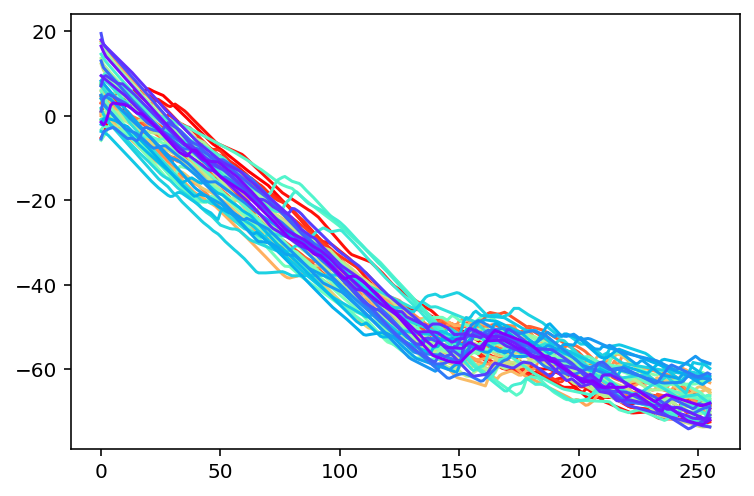

In [5]:
samples = 50
colors = cm.rainbow(np.linspace(1, 0, samples))
for i in range(samples):
    plt.plot(raob[i,:,dl.TEMPERATURE], color=colors[i]);

In [15]:
def plot_level_distn(data, varibale, ms=5):
    fig, axs = plt.subplots(2, 1, figsize=(12, 8))
    levels = np.linspace(0, data.shape[1]-1, ms, dtype=int)
    for i in range(ms):
        measurements = data[:, levels[i], varibale]
        axs[0].hist(measurements, bins=35, alpha=0.35, label=f'{levels[i]}');
    
    data_to_plot = [data[:, levels[i], varibale] for i in range(ms)]
    axs[1].boxplot(data_to_plot)
    axs[1].set_xticklabels(levels);
    
    axs[0].legend(); 
    axs[0].set_xlabel('Degree [C]'); axs[1].set_ylabel('Count')
    axs[1].set_xlabel('Level Index'); axs[1].set_ylabel('Degree [C]')
    
    fig.tight_layout()

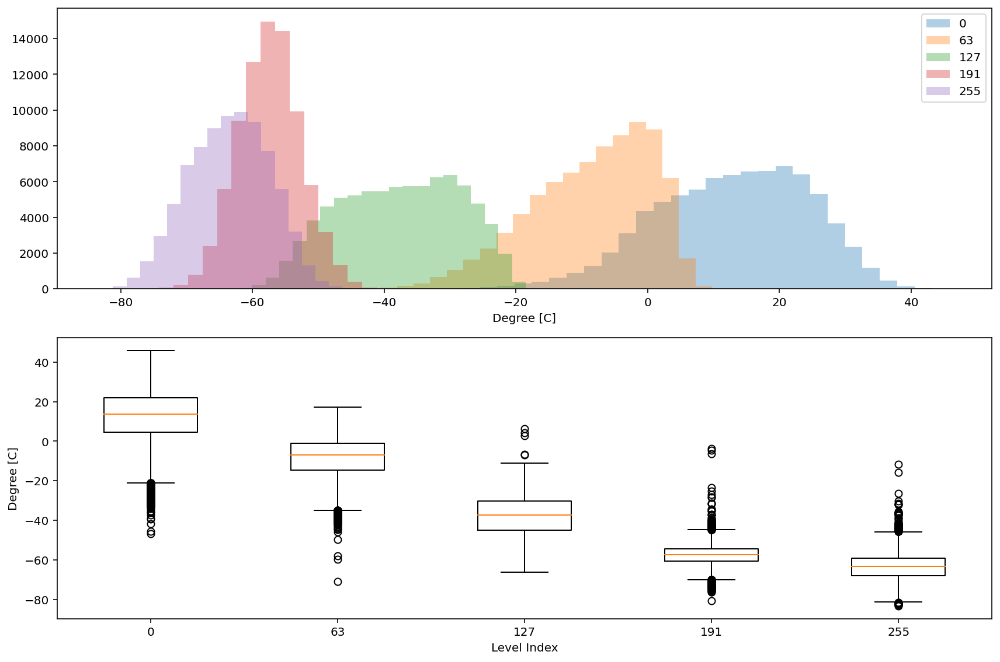

In [16]:
plot_level_distn(raob, dl.TEMPERATURE, ms=5)

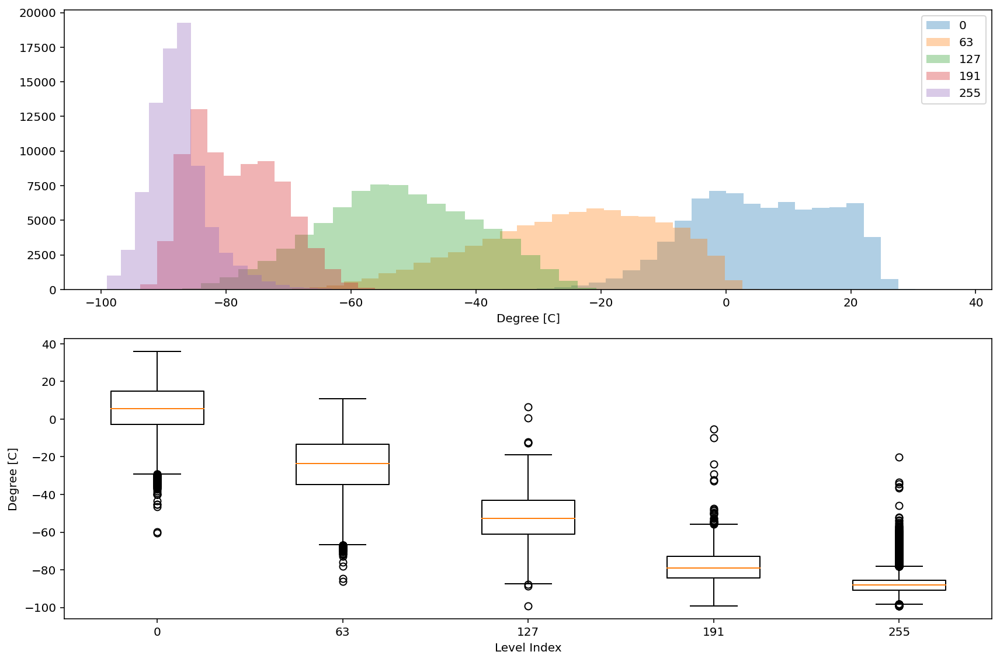

In [17]:
plot_level_distn(raob, dl.DEWPOINT, ms=5)

Unique Sites: 70


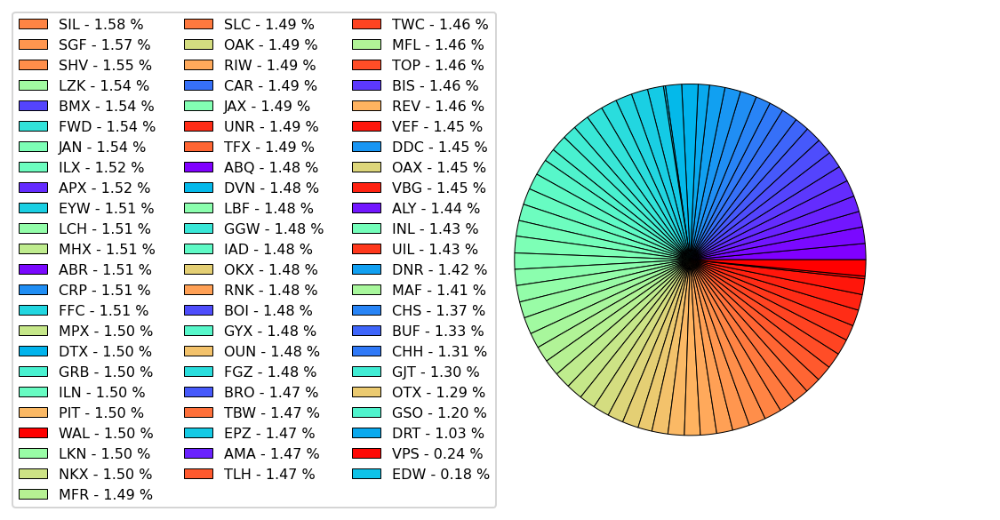

In [18]:
sites = np.array(sorted([fn.split('/')[-1].split('_')[0] for fn in glob.glob(os.path.join(processed_vol, '*')) 
                         if not os.path.basename(fn).startswith('sgp')]))

site_names, counts = np.unique(sites, return_counts=True)
print('Unique Sites:', len(site_names))

fig, ax = plt.subplots()

colors = cm.rainbow(np.linspace(0, 1, len(site_names)))

patches, texts = ax.pie(counts, colors=colors,
                         wedgeprops={'edgecolor':'k', 'linewidth': 0.5, 'antialiased': True})
ax.axis('equal') # Equal aspect ratio ensures that pie is drawn as a circle.

percent = 100.*counts/counts.sum()
labels = ['{0} - {1:1.2f} %'.format(i.upper(),j) for i,j in zip(site_names, percent)]
# sort legend
patches, labels, _ =  zip(*sorted(zip(patches, labels, counts),
                                      key=lambda x: x[2],
                                      reverse=True))

ax.legend(patches, labels, loc='center left', bbox_to_anchor=(-0.65, 0.5), fontsize=8, ncol=3);

## Differences

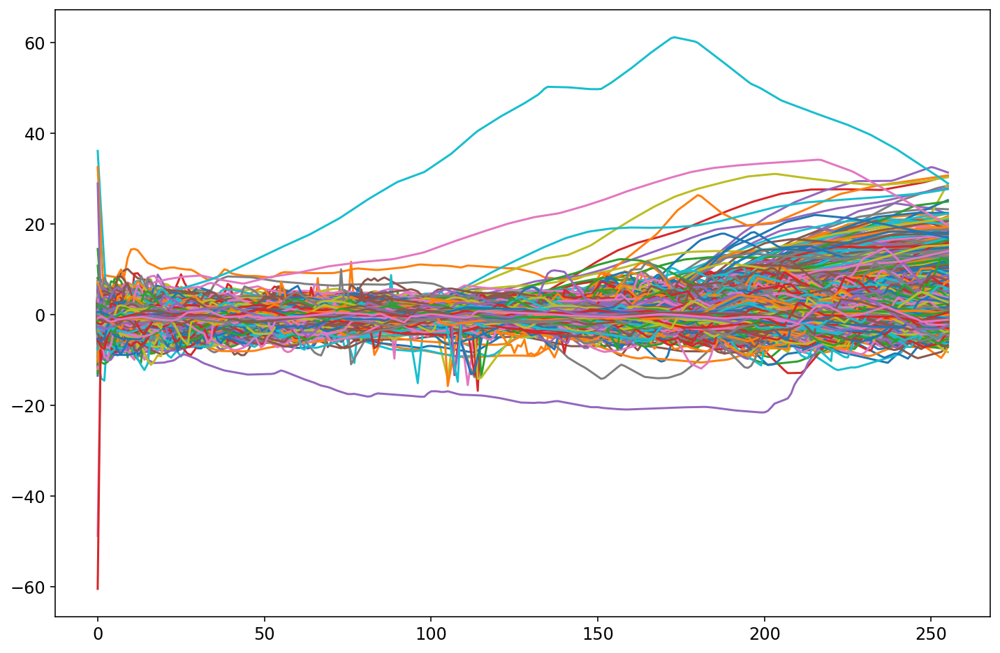

In [39]:
diff = raob[:,:,dl.TEMPERATURE] - rap[:,:,dl.TEMPERATURE]

fig, axs = plt.subplots(figsize=(12, 8))
for p in (diff):
    axs.plot(p)

In [67]:
threshold = 20
inds = np.unique(np.where(abs(diff) >= threshold)[0])

raob = np.delete(raob, inds, 0)
rap  = np.delete(rap, inds, 0)
goes = np.delete(goes, inds, 0)
rtma = np.delete(rtma, inds, 0)
sonde_files = np.delete(sonde_files, inds, 0)

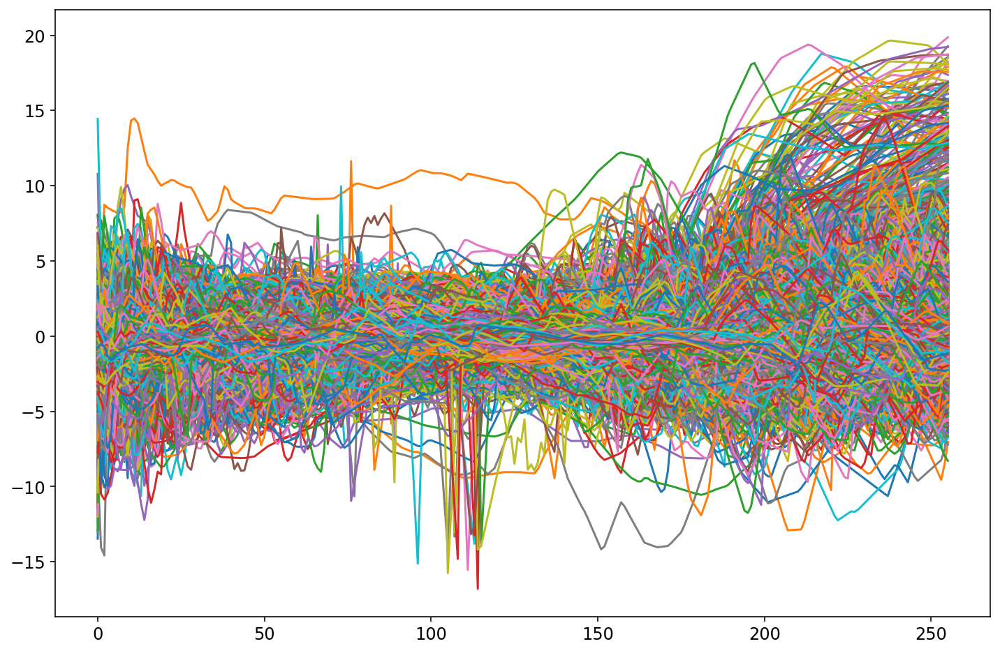

In [68]:
diff = raob[:,:,dl.TEMPERATURE] - rap[:,:,dl.TEMPERATURE]

fig, axs = plt.subplots(figsize=(12, 8))
for p in (diff):
    axs.plot(p)

In [42]:
ml.rmse(rap[:,:,dl.DEWPOINT], raob[:,:,dl.DEWPOINT]), ml.rmse(rap[:,:,dl.TEMPERATURE], raob[:,:,dl.TEMPERATURE])

(5.678165660155681, 1.1538007247921902)

In [8]:
for i in range(len(raob)):
    print(''.join(['-']*25))
#     print(f'Pressure:  {raob[i,0,dl.PRESSURE]:.3f}, {rap[i,0,dl.PRESSURE]:.3f}')
#     print(f'Temperature: {raob[i,0,dl.TEMPERATURE]:.3f}, {rap[i,0,dl.TEMPERATURE]:.3f}')
#     print(f'Dewpoint: {raob[i,0,dl.DEWPOINT]:.3f}, {rap[i,0,dl.DEWPOINT]:.3f}')
    print(f'Altitude: {raob[i,0,dl.ALTITUDE]:.3f}, {rap[i,0,dl.ALTITUDE]:.3f}')

-------------------------
Altitude: 1619.000, 1638.730
-------------------------
Altitude: 1619.000, 1638.620
-------------------------
Altitude: 397.000, 408.235
-------------------------
Altitude: 397.000, 407.867
-------------------------
Altitude: 94.000, 97.735
-------------------------
Altitude: 94.000, 97.242
-------------------------
Altitude: 1095.000, 1099.120
-------------------------
Altitude: 448.000, 413.735
-------------------------
Altitude: 448.000, 413.117
-------------------------
Altitude: 503.000, 548.860
-------------------------
Altitude: 503.000, 548.445
-------------------------
Altitude: 178.000, 173.235
-------------------------
Altitude: 178.000, 172.992
-------------------------
Altitude: 180.000, 171.110
-------------------------
Altitude: 180.000, 170.867
-------------------------
Altitude: 871.000, 960.110
-------------------------
Altitude: 871.000, 959.742
-------------------------
Altitude: 7.000, 17.360
-------------------------
Altitude: 7.000, 17.1

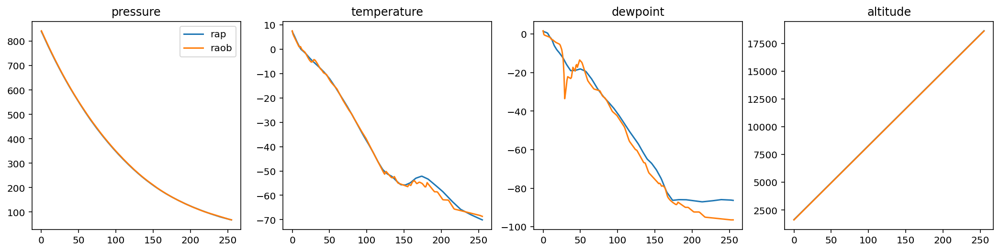

In [14]:
index = 8
fig, axs = plt.subplots(1, 4, figsize=(18, 4))

axs[0].plot(rap[index,:,dl.PRESSURE], label='rap')
axs[0].plot(raob[index,:,dl.PRESSURE], label='raob')
axs[0].set_title('pressure')

axs[1].plot(rap[index,:,dl.TEMPERATURE], label='rap')
axs[1].plot(raob[index,:,dl.TEMPERATURE], label='raob')
axs[1].set_title('temperature')

axs[2].plot(rap[index,:,dl.DEWPOINT], label='rap')
axs[2].plot(raob[index,:,dl.DEWPOINT], label='raob')
axs[2].set_title('dewpoint')

axs[3].plot(rap[index,:,dl.ALTITUDE], label='rap')
axs[3].plot(raob[index,:,dl.ALTITUDE], label='raob')
axs[3].set_title('altitude')

axs[0].legend()

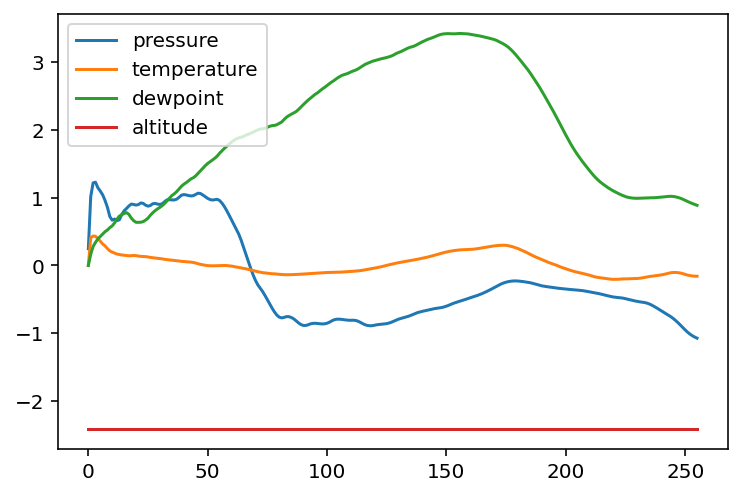

In [5]:
index = 8
fig, axs = plt.subplots(1, 1, figsize=(6, 4))

axs.plot(np.mean(rap[:,:,dl.PRESSURE] - raob[:,:,dl.PRESSURE], axis=0), label='pressure')
axs.plot(np.mean(rap[:,:,dl.TEMPERATURE] - raob[:,:,dl.TEMPERATURE], axis=0), label='temperature')
axs.plot(np.mean(rap[:,:,dl.DEWPOINT] - raob[:,:,dl.DEWPOINT], axis=0), label='dewpoint')
axs.plot(np.mean(rap[:,:,dl.ALTITUDE] - raob[:,:,dl.ALTITUDE], axis=0), label='altitude')
axs.legend()


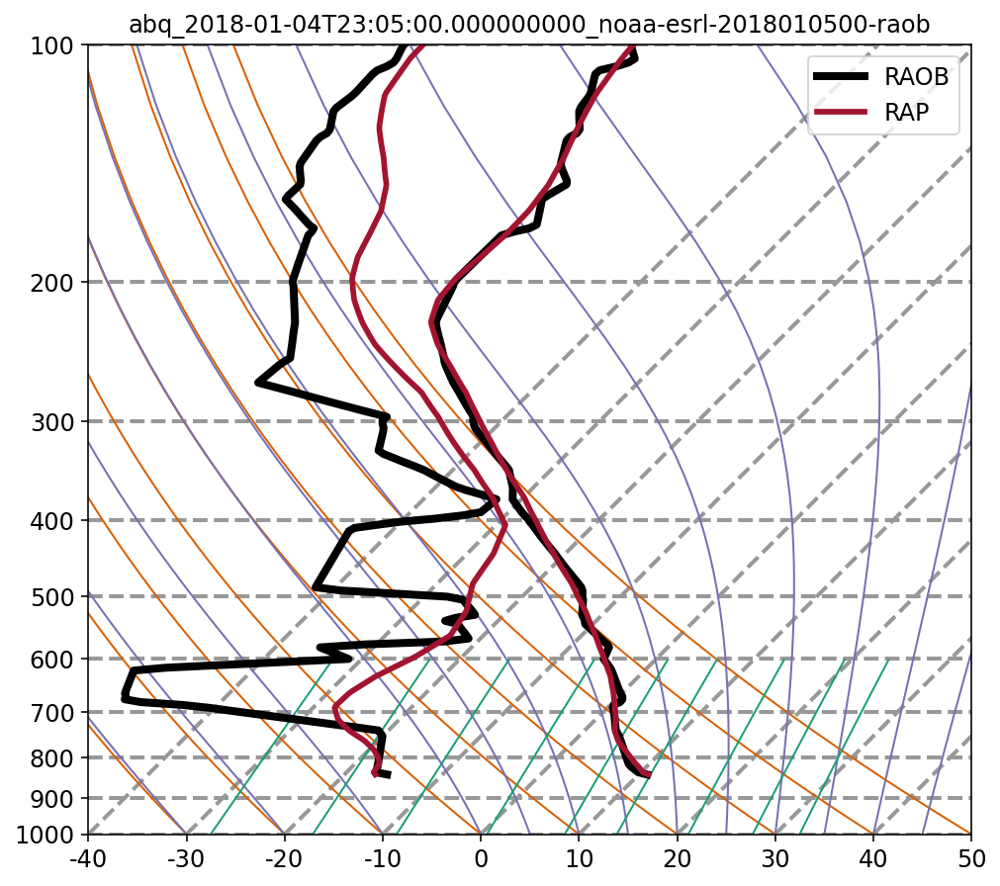

In [19]:
index = 7
sounding = dict()
sounding[radiosonde_utils.PRESSURE_COLUMN_KEY] = rap[index,:,dl.PRESSURE]

sounding[radiosonde_utils.TEMPERATURE_COLUMN_KEY] = raob[index,:,dl.TEMPERATURE]
sounding[radiosonde_utils.NWP_TEMPERATURE_COLUMN_KEY] = rap[index,:,dl.TEMPERATURE]

sounding[radiosonde_utils.DEWPOINT_COLUMN_KEY] = raob[index,:,dl.DEWPOINT]
sounding[radiosonde_utils.NWP_DEWPOINT_COLUMN_KEY] = rap[index,:,dl.DEWPOINT]

title = sonde_files[index]
radiosonde_plotting.plot_nwp_ml_sounding(sounding, title_string=title);
                                         # file_name=f"/home/stock/research/media/{title}-rapvraob.png");

# RAP

- [Linear](#Linear-NN)
- [Fully Connected](#Fully-Connected-NN)
- [Conv1D NN](#Conv1D-NN)
- [CAE NN](#CAE-NN)
- [Transfer Learning RAOB](#Transfer-Learning-RAOB)

## Linear NN

### Temperature

In [20]:
Xtrain, Ttrain, Xtest, Ttest = ml.partition(rap, raob, (0.8, 0.2), shuffle=True)

input_dims = [dl.TEMPERATURE]
Xt = Xtrain[:,:,input_dims].reshape(Xtrain.shape[0],-1)
Tt = Ttrain[:,:,[dl.TEMPERATURE]].reshape(Ttrain.shape[0],-1)
Xe = Xtest[:,:,input_dims].reshape(Xtest.shape[0],-1)
Te = Ttest[:,:,[dl.TEMPERATURE]].reshape(Ttest.shape[0],-1)

# Flatten inputs to (n, 3) and (n, 1) vectors
# input_dims = [dl.PRESSURE, dl.TEMPERATURE, dl.DEWPOINT]
# Xt = Xtrain[:,:,input_dims]
# Xt = Xt.reshape(-1, Xt.shape[-1])
# Tt = Ttrain[:,:,[dl.TEMPERATURE]]
# Tt = Tt.reshape(-1, Tt.shape[-1])
# Xe = Xtest[:,:,input_dims]
# Xe = Xe.reshape(-1, Xe.shape[-1])
# Te = Ttest[:,:,[dl.TEMPERATURE]]
# Te = Te.reshape(-1, Te.shape[-1])

Xt.shape, Tt.shape, Xe.shape, Te.shape

((65021, 256), (65021, 256), (16255, 256), (16255, 256))

In [21]:
nnet = nn.NeuralNetwork(Xt.shape[1], [0], Tt.shape[1])

nnet.model.summary()

nnet.train(Xt, Tt, 50, 32, method='adam', verbose=True, 
           learning_rate=0.001, validation=[Xe, Te])

Model: "functional_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 256)]             0         
_________________________________________________________________
dense (Dense)                (None, 256)               65792     
Total params: 65,792
Trainable params: 65,792
Non-trainable params: 0
_________________________________________________________________
epoch: 0, rmse 1.32770, val_rmse 1.23152
epoch: 10, rmse 1.18222, val_rmse 1.27197
epoch: 20, rmse 1.18112, val_rmse 1.20019
epoch: 30, rmse 1.17926, val_rmse 1.29632
epoch: 40, rmse 1.17910, val_rmse 1.22721
epoch: 49, rmse 1.17867, val_rmse 1.25766
finished!


NeuralNetwork(256, [0], 256)
  Final objective value is 0.03839 in 118.5330 seconds.

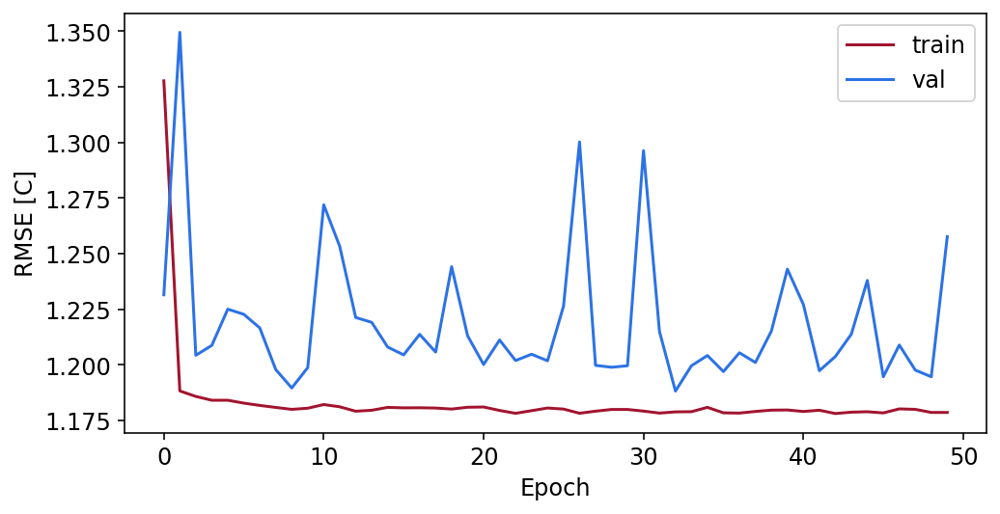

In [22]:
results.plot_loss(nnet)

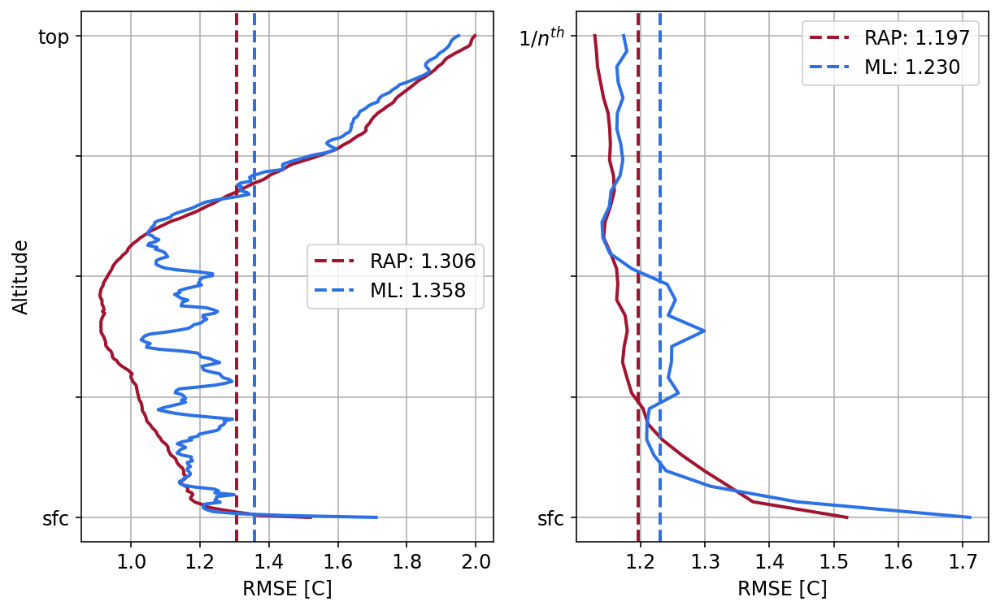

In [23]:
results.plot_altitude_rmse_verticle(nnet, Xe, Te, Xtest[:,:,dl.TEMPERATURE])

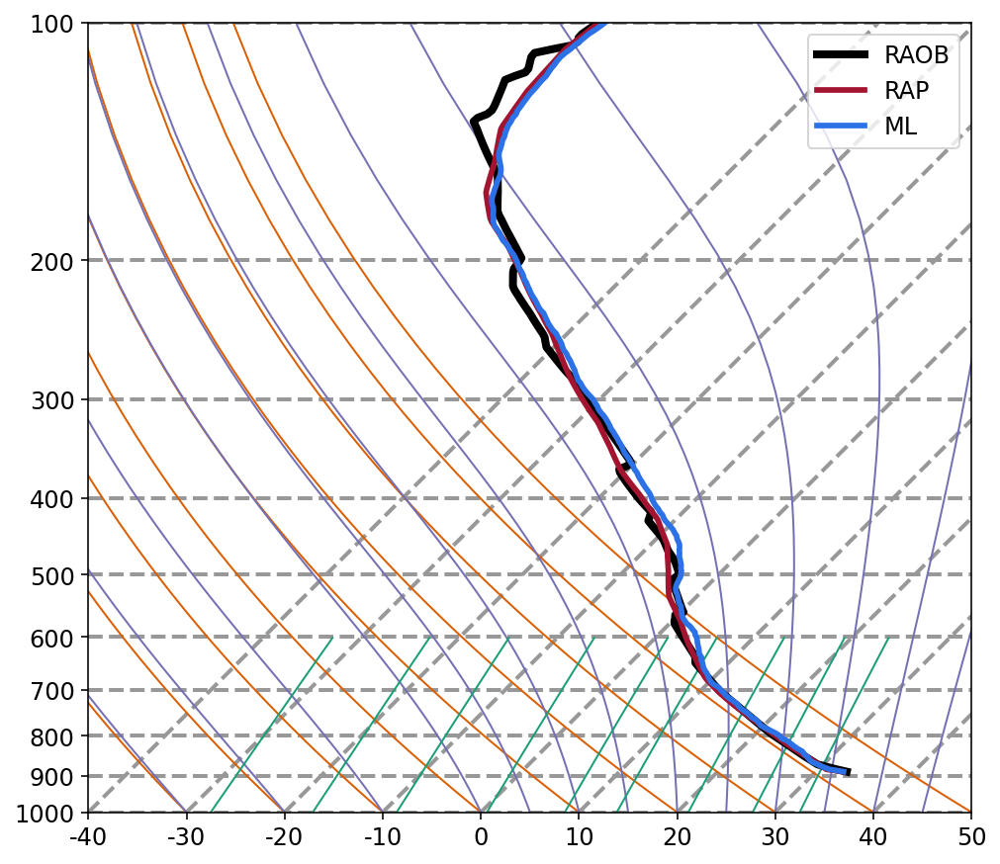

In [24]:
i = 11
sounding = dict()
sounding[radiosonde_utils.PRESSURE_COLUMN_KEY] = Xtest[i,:,dl.PRESSURE]
sounding[radiosonde_utils.TEMPERATURE_COLUMN_KEY] = Te[i]
sounding[radiosonde_utils.NWP_TEMPERATURE_COLUMN_KEY] = Xtest[i,:,dl.TEMPERATURE]
sounding[radiosonde_utils.PREDICTED_TEMPERATURE_COLUMN_KEY] = nnet.use(Xe[i:i+1,:])[0]

radiosonde_plotting.plot_nwp_ml_sounding(sounding);

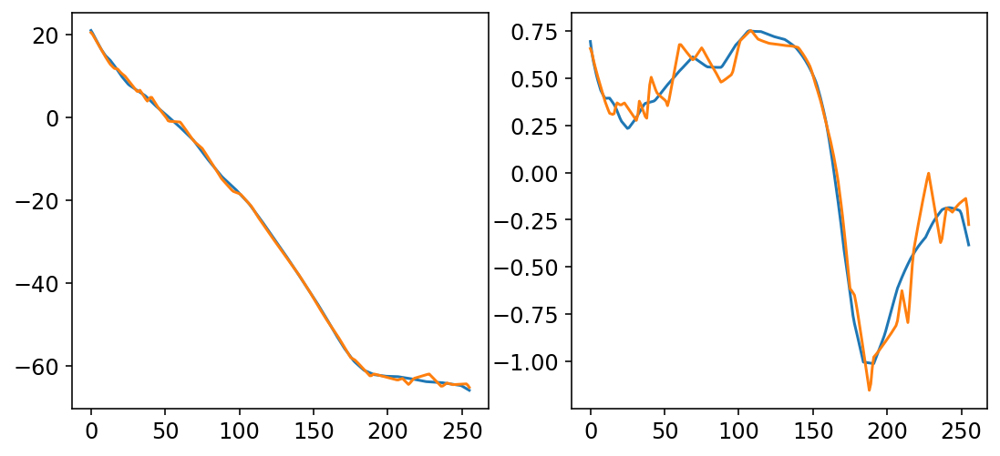

In [25]:
i = 11
fig, axs = plt.subplots(1, 2, figsize=(9, 4))
axs[0].plot(Xt[i])
axs[0].plot(Tt[i])
axs[1].plot(nnet._standardizeX(Xt[i:i+1])[0])
axs[1].plot(nnet._standardizeT(Tt[i:i+1])[0])
plt.show()

### Moisture

In [26]:
Xtrain, Ttrain, Xtest, Ttest = ml.partition(rap, raob, (0.8,0.2), shuffle=True)

input_dims = [dl.DEWPOINT]
Xt = Xtrain[:,:,input_dims].reshape(Xtrain.shape[0],-1)
Tt = Ttrain[:,:,[dl.DEWPOINT]].reshape(Ttrain.shape[0],-1)
Xe = Xtest[:,:,input_dims].reshape(Xtest.shape[0],-1)
Te = Ttest[:,:,[dl.DEWPOINT]].reshape(Ttest.shape[0],-1)

Xt.shape, Tt.shape, Xe.shape, Te.shape

((65021, 256), (65021, 256), (16255, 256), (16255, 256))

In [28]:
nnet = nn.NeuralNetwork(Xt.shape[1], [0], Tt.shape[1])

# nnet.model.summary()

nnet.train(Xt, Tt, 20, 128, method='adam', verbose=True, 
           learning_rate=0.001, validation=[Xe, Te])

epoch: 0, rmse 5.41941, val_rmse 5.02620
epoch: 4, rmse 5.01973, val_rmse 4.99585
epoch: 8, rmse 5.01170, val_rmse 5.00850
epoch: 12, rmse 5.01426, val_rmse 4.99443
epoch: 16, rmse 5.01391, val_rmse 5.00234
epoch: 19, rmse 5.01106, val_rmse 4.99481
finished!


NeuralNetwork(256, [0], 256)
  Final objective value is 0.33639 in 13.4963 seconds.

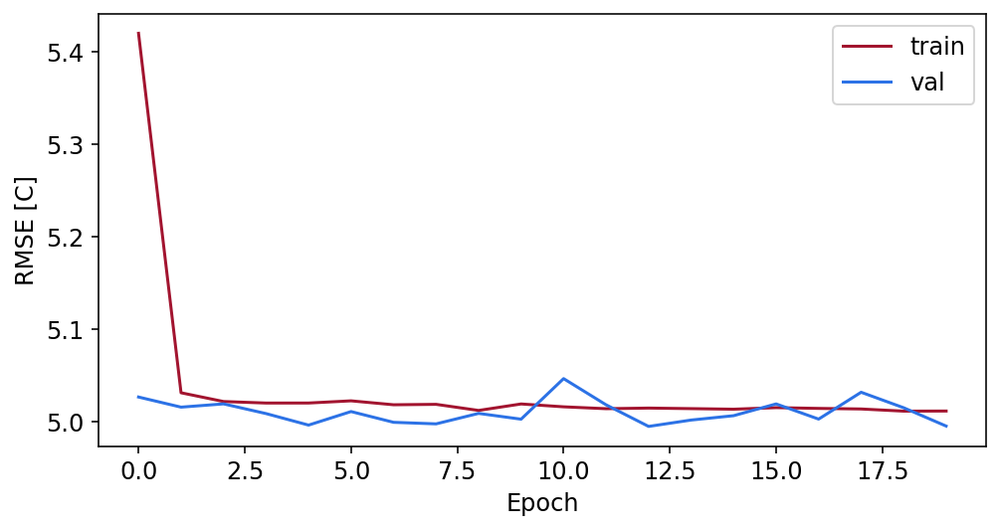

In [29]:
results.plot_loss(nnet)

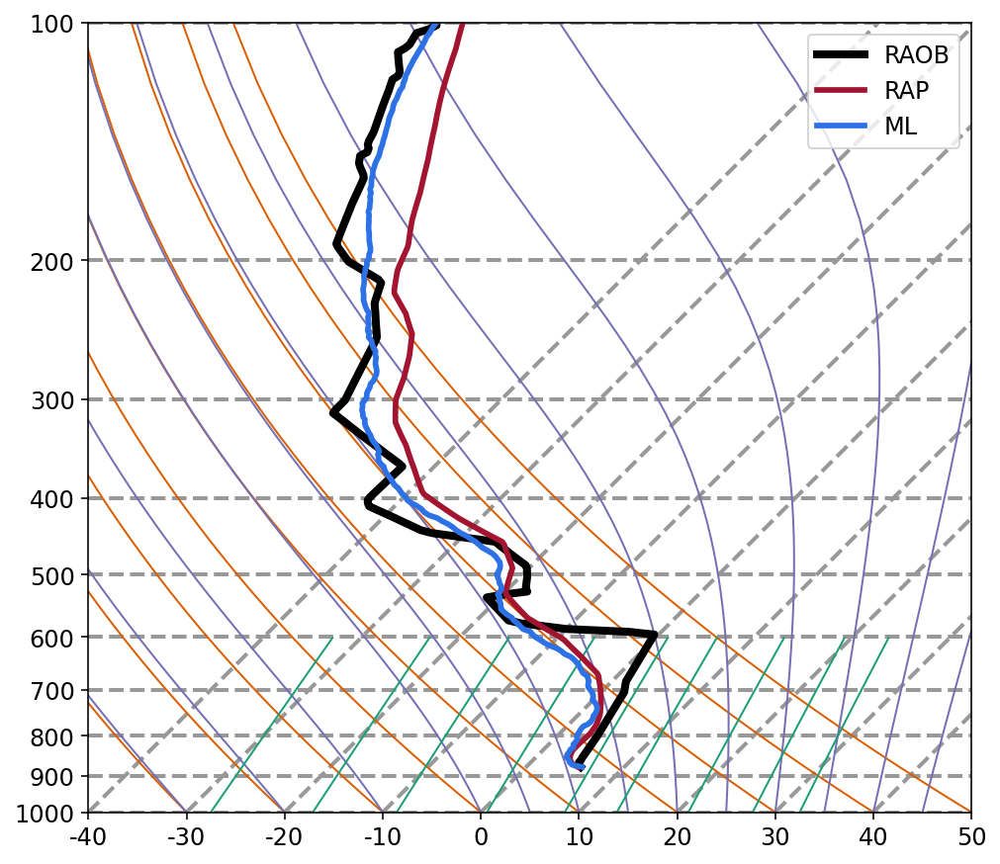

In [30]:
i = 1
sounding = dict()
sounding[radiosonde_utils.PRESSURE_COLUMN_KEY] = Xtest[i,:,dl.PRESSURE]
sounding[radiosonde_utils.TEMPERATURE_COLUMN_KEY] = Te[i]
sounding[radiosonde_utils.NWP_TEMPERATURE_COLUMN_KEY] = Xtest[i,:,dl.DEWPOINT]
sounding[radiosonde_utils.PREDICTED_TEMPERATURE_COLUMN_KEY] = nnet.use(Xe[i:i+1,:])[0]

radiosonde_plotting.plot_nwp_ml_sounding(sounding);

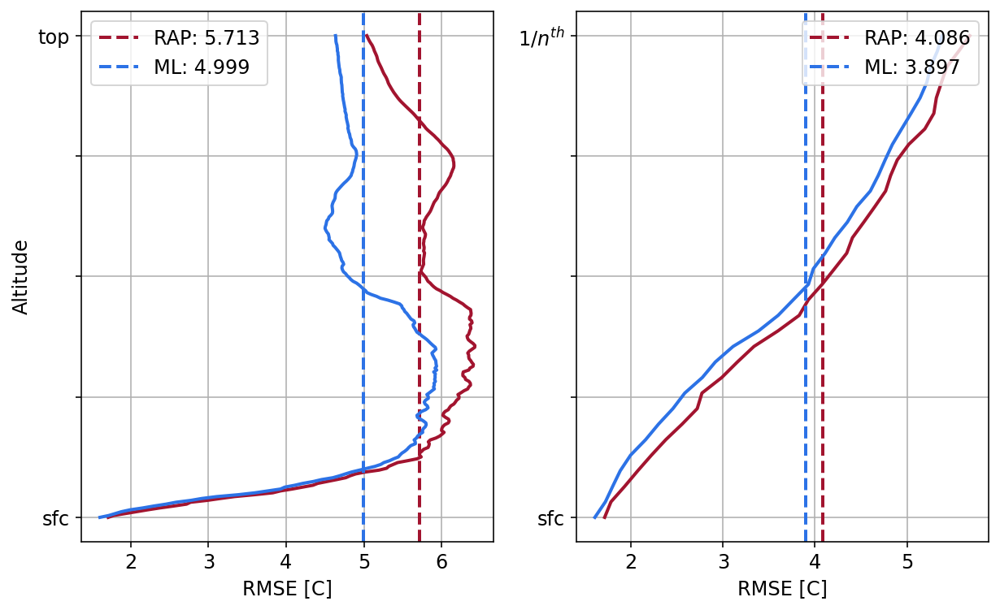

In [31]:
results.plot_altitude_rmse_verticle(nnet, Xe, Te, Xtest[:,:,dl.DEWPOINT])

## Fully Connected NN

### Temperature

In [243]:
for i in range(1, 13):
    monthly = np.flatnonzero(np.core.defchararray.find(sonde_files, f'2019-{i:02}')!=-1)
    print(f'2019-{i:02}', len(monthly))

2019-01 1379
2019-02 1620
2019-03 2485
2019-04 2592
2019-05 1962
2019-06 1655
2019-07 1838
2019-08 1063
2019-09 1138
2019-10 789
2019-11 1027
2019-12 0


In [37]:
# monthly = np.flatnonzero(np.core.defchararray.find(sonde_files, '2019-06')!=-1)
Xtrain, Ttrain, Xtest, Ttest = ml.partition(rap, raob, (0.8,0.2), shuffle=True)

diff = Xtrain[:,:,dl.TEMPERATURE] - Ttrain[:,:,dl.TEMPERATURE]
inds = np.unique(np.where(abs(diff) > 20)[0])
Xtrain = np.delete(Xtrain, inds, 0)
Ttrain = np.delete(Ttrain, inds, 0)

diff = Xtest[:,:,dl.TEMPERATURE] - Ttest[:,:,dl.TEMPERATURE]
inds = np.unique(np.where(abs(diff) > 20)[0])
Xtest = np.delete(Xtest, inds, 0)
Ttest = np.delete(Ttest, inds, 0)

input_dims = [dl.TEMPERATURE]
Xt = Xtrain[:,:,input_dims].reshape(Xtrain.shape[0],-1)
Tt = Ttrain[:,:,[dl.TEMPERATURE]].reshape(Ttrain.shape[0],-1)
Xe = Xtest[:,:,input_dims].reshape(Xtest.shape[0],-1)
Te = Ttest[:,:,[dl.TEMPERATURE]].reshape(Ttest.shape[0],-1)

Xt.shape, Tt.shape, Xe.shape, Te.shape

((28136, 256), (28136, 256), (7035, 256), (7035, 256))

FloatProgress(value=0.0, max=8.0)

{'epochs': 100, 'batch_size': 32, 'method': 'adam', 'lr': 0.0005, 'activation': 'relu', 'layers': [32]}


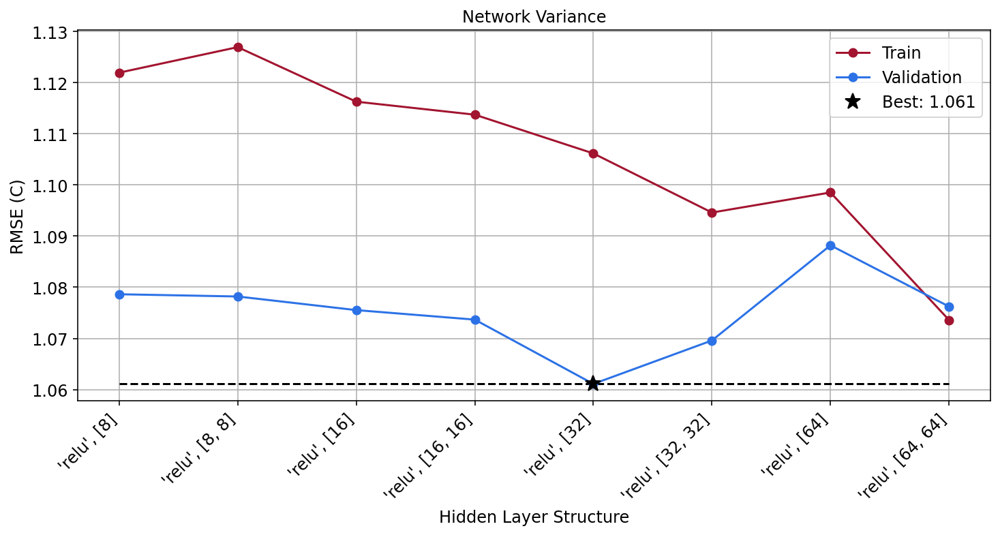

In [29]:
activations = ['relu']
layers = [[nu] * nl for nu in [8, 16, 32, 64] for nl in range(1, 3)]
product = list(itertools.product(activations, layers))

nnet, train_history, val_history = param_search(nn.NeuralNetwork, product, Xt, Tt, Xe, Te,
                                   epochs=100, batch_size=32, method='adam', lr=0.0005, verbose=False)
plot_param_search(product, train_history, val_history, rotation=45)

/home/stock/.local/lib/python3.8/site-packages/numpy/core/fromnumeric.py:3334: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/stock/.local/lib/python3.8/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/home/stock/.local/lib/python3.8/site-packages/numpy/core/fromnumeric.py:3334: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/stock/.local/lib/python3.8/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


ValueError: zero-size array to reduction operation minimum which has no identity

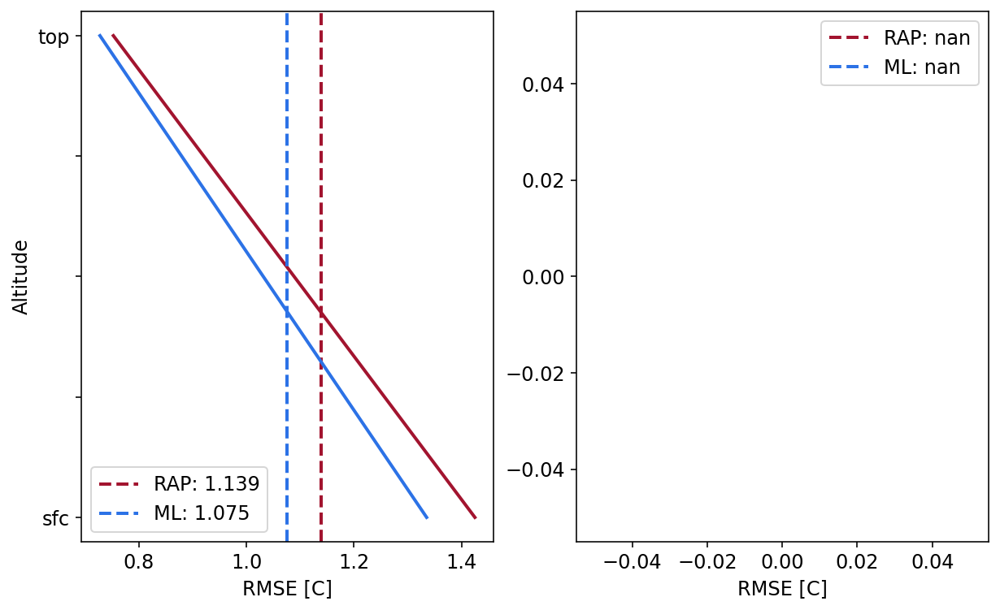

In [31]:
results.plot_altitude_rmse_verticle(nnet, Xe, Te, Xtest[:,:,dl.TEMPERATURE])

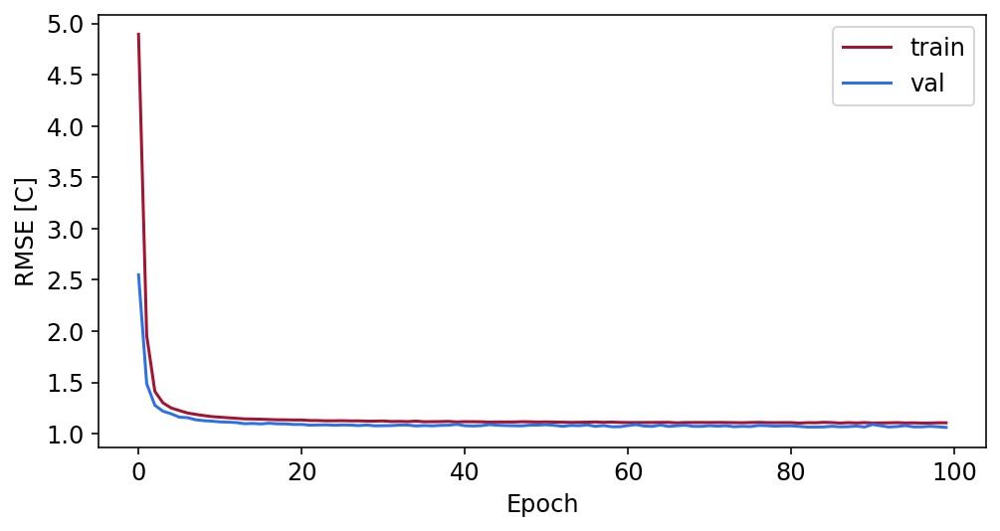

In [32]:
results.plot_loss(nnet)

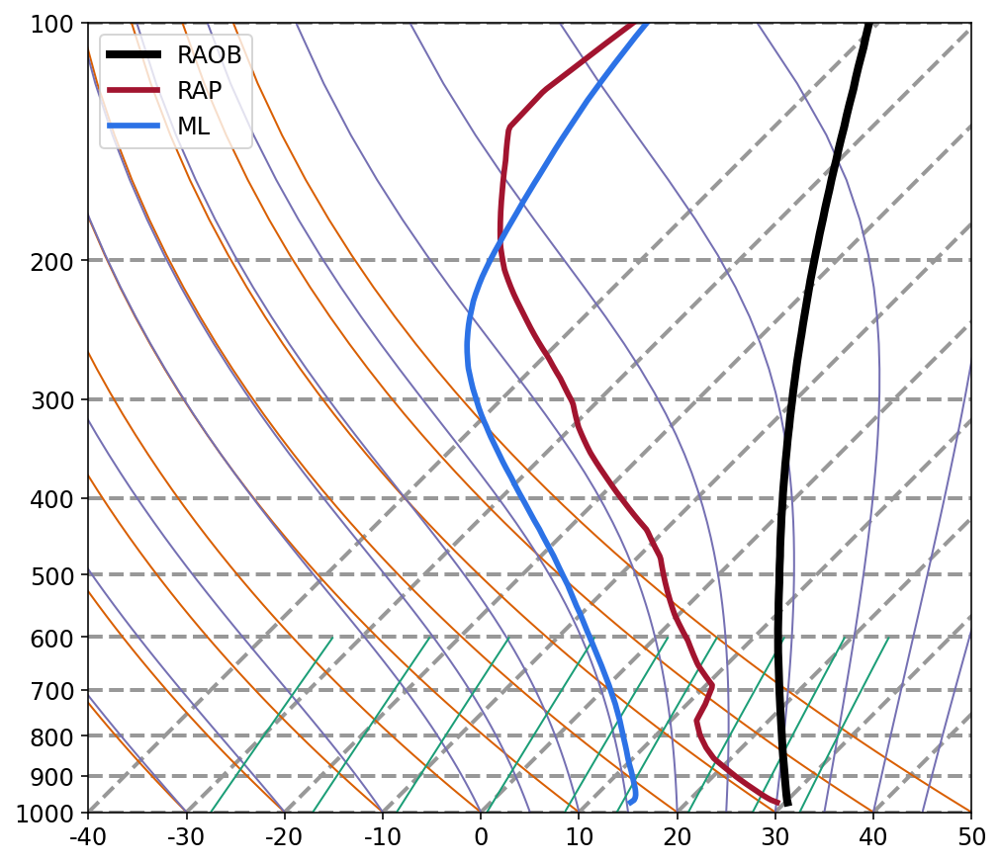

In [294]:
i = inds[19]
sounding = dict()
sounding[radiosonde_utils.PRESSURE_COLUMN_KEY] = Xtrain[i,:,dl.PRESSURE]
sounding[radiosonde_utils.TEMPERATURE_COLUMN_KEY] = Tt[i] # + Xtest[i,:,dl.TEMPERATURE]
sounding[radiosonde_utils.NWP_TEMPERATURE_COLUMN_KEY] = Xtrain[i,:,dl.TEMPERATURE]
sounding[radiosonde_utils.PREDICTED_TEMPERATURE_COLUMN_KEY] = nnet.use(Xt[i:i+1,:])[0] # + Xtest[i,:,dl.TEMPERATURE]

radiosonde_plotting.plot_nwp_ml_sounding(sounding);

In [38]:
nnet = nn.NeuralNetwork(Xt.shape[1], [100]*10, Tt.shape[1], activation='relu')
nnet.train(Xt, Tt, 1000, 64, method='adam',
           verbose=True, learning_rate=0.001, validation=(Xe, Te))

epoch: 0, rmse 2.58752, val_rmse 1.67532
epoch: 200, rmse 1.15742, val_rmse 1.23904
epoch: 400, rmse 1.13734, val_rmse 1.24107


KeyboardInterrupt: 

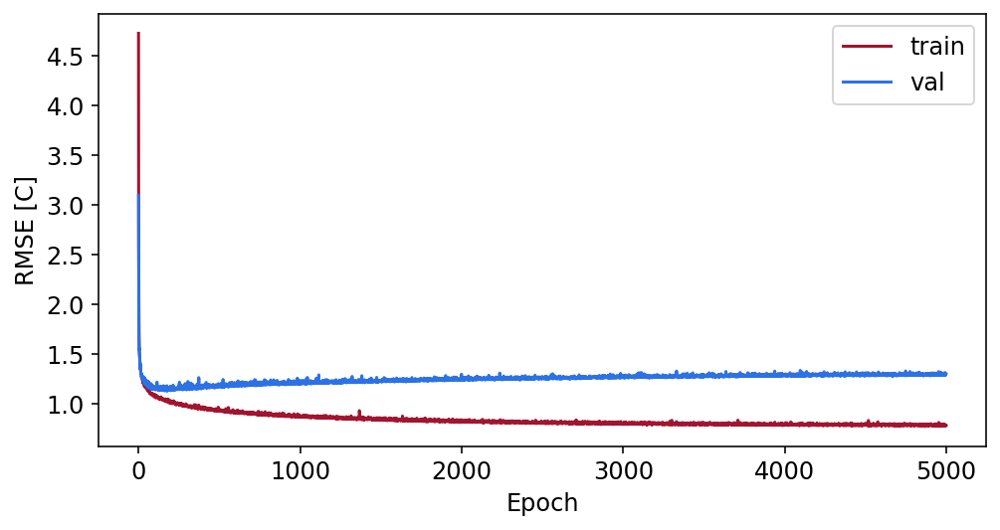

In [309]:
results.plot_loss(nnet)

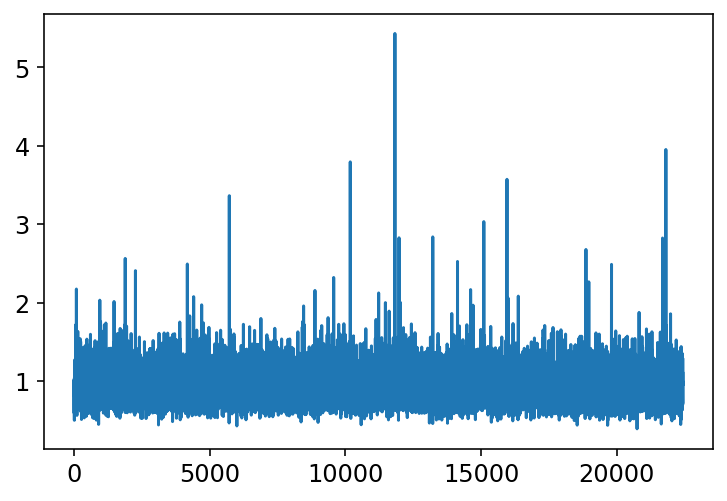

In [52]:
Y = nnet.use(Xt)
plt.plot(np.sqrt(np.mean((Y - Tt)**2, axis = 1)))

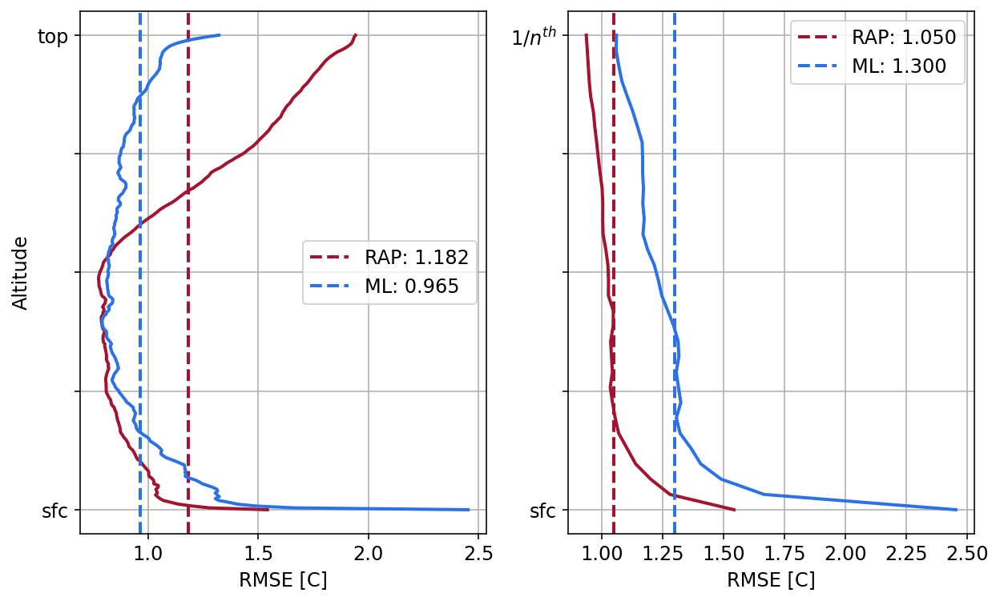

In [53]:
results.plot_altitude_rmse_verticle(nnet, Xt, Tt, Xtrain[:,:,dl.TEMPERATURE])

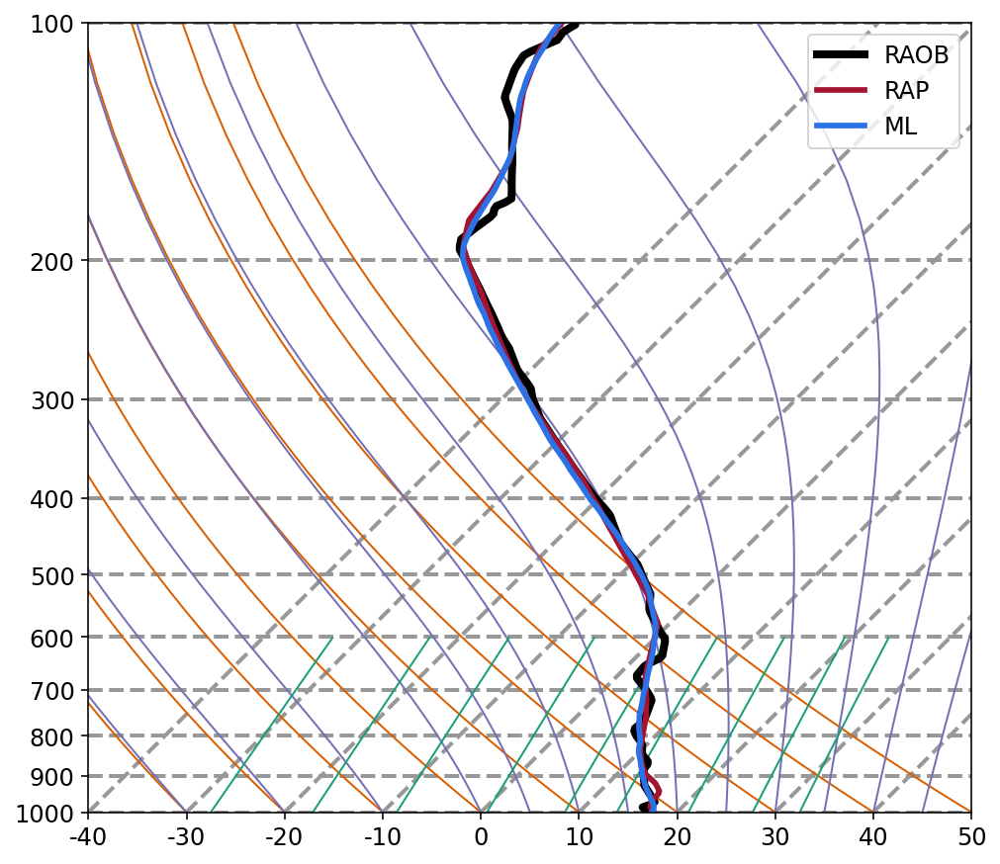

In [60]:
i = 3
sounding = dict()
sounding[radiosonde_utils.PRESSURE_COLUMN_KEY] = Xtest[i,:,dl.PRESSURE]
sounding[radiosonde_utils.TEMPERATURE_COLUMN_KEY] = Te[i]
sounding[radiosonde_utils.NWP_TEMPERATURE_COLUMN_KEY] = Xtest[i,:,dl.TEMPERATURE]
sounding[radiosonde_utils.PREDICTED_TEMPERATURE_COLUMN_KEY] = nnet.use(Xe[i:i+1,:])[0]

radiosonde_plotting.plot_nwp_ml_sounding(sounding);

### Moisture

In [27]:
Xtrain, Ttrain, Xtest, Ttest = ml.partition(rap, raob, (0.8,0.2), shuffle=False)

input_dims = [dl.PRESSURE, dl.DEWPOINT]
Xt = Xtrain[:,:,input_dims].reshape(Xtrain.shape[0],-1)
Tt = Ttrain[:,:,[dl.DEWPOINT]].reshape(Ttrain.shape[0],-1)
Xe = Xtest[:,:,input_dims].reshape(Xtest.shape[0],-1)
Te = Ttest[:,:,[dl.DEWPOINT]].reshape(Ttest.shape[0],-1)

Xt.shape, Tt.shape, Xe.shape, Te.shape

((1026, 512), (1026, 256), (257, 512), (257, 256))

FloatProgress(value=0.0, max=18.0)

{'epochs': 50, 'batch_size': 32, 'method': 'adam', 'lr': 0.001, 'activation': 'relu', 'layers': [128]}


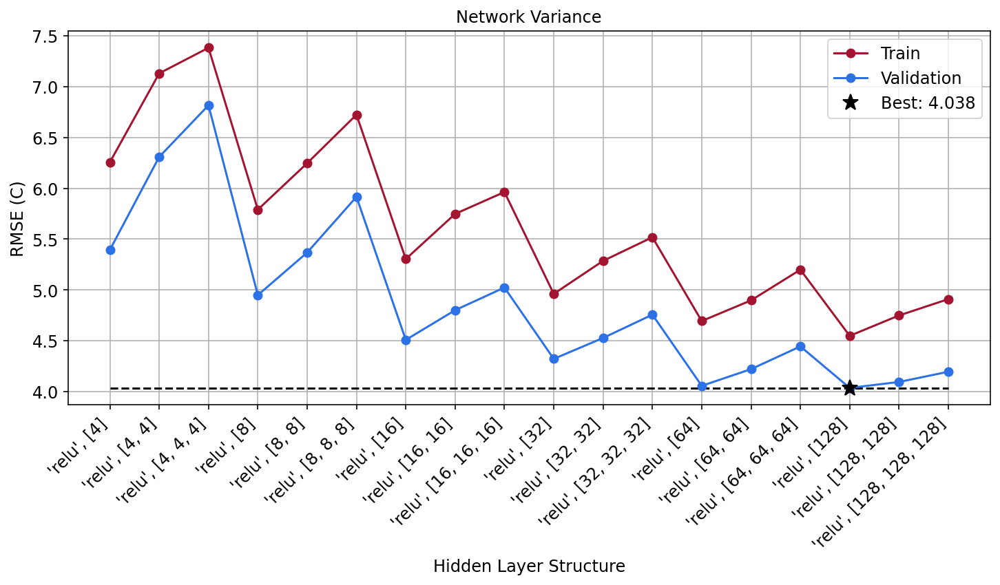

In [28]:
activations = ['relu']
layers = [[nu] * nl for nu in [4, 8, 16, 32, 64, 128] for nl in range(1, 4)]
product = list(itertools.product(activations, layers))

nnet, train_history, val_history = param_search(nn.NeuralNetwork, product, Xt, Tt, Xe, Te,
                                   epochs=50, batch_size=32, method='adam', lr=0.001, verbose=False)
plot_param_search(product, train_history, val_history, rotation=45)

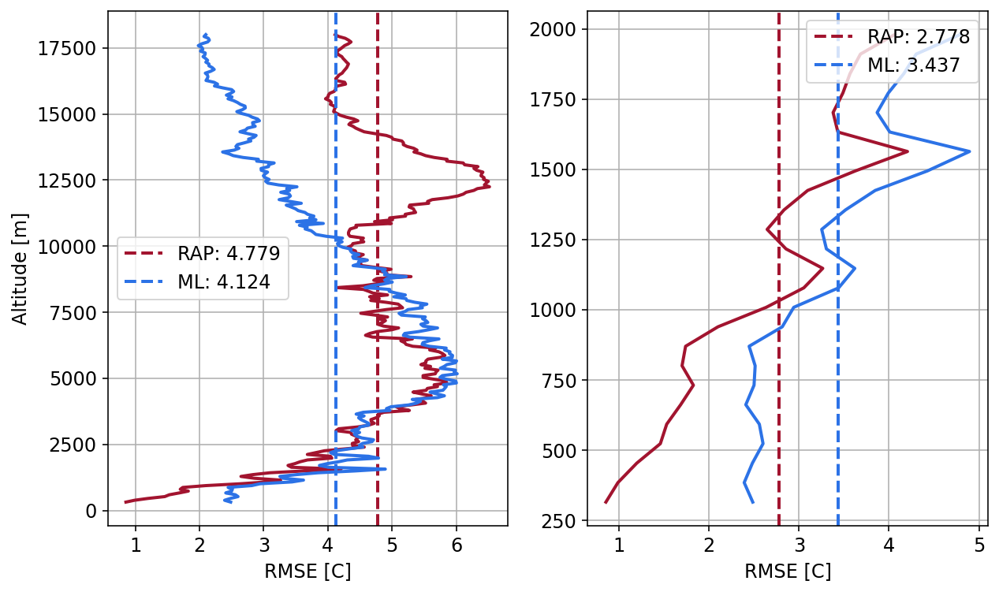

In [29]:
results.plot_altitude_rmse_verticle(nnet, Xe, Te, Xtest[:,:,dl.DEWPOINT], alt=raob[0, :, -1])

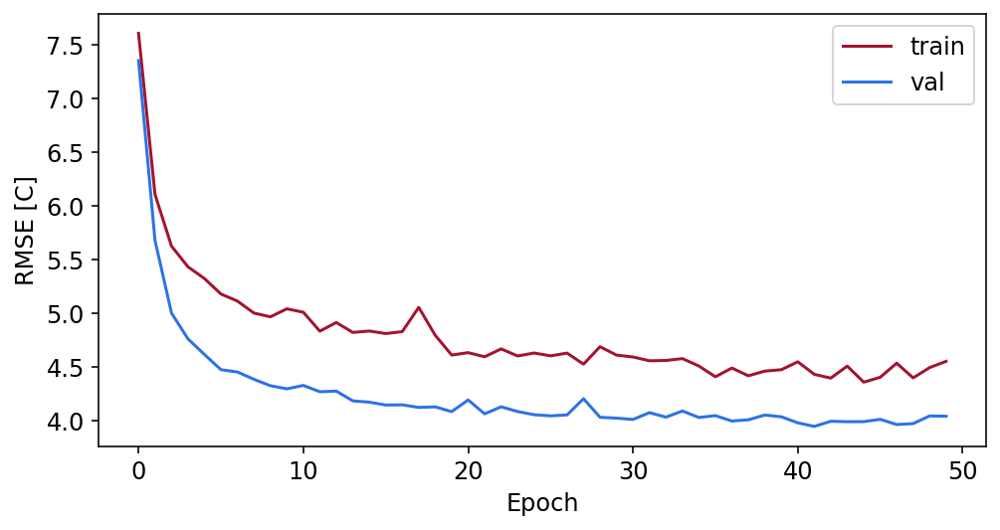

In [30]:
results.plot_loss(nnet)

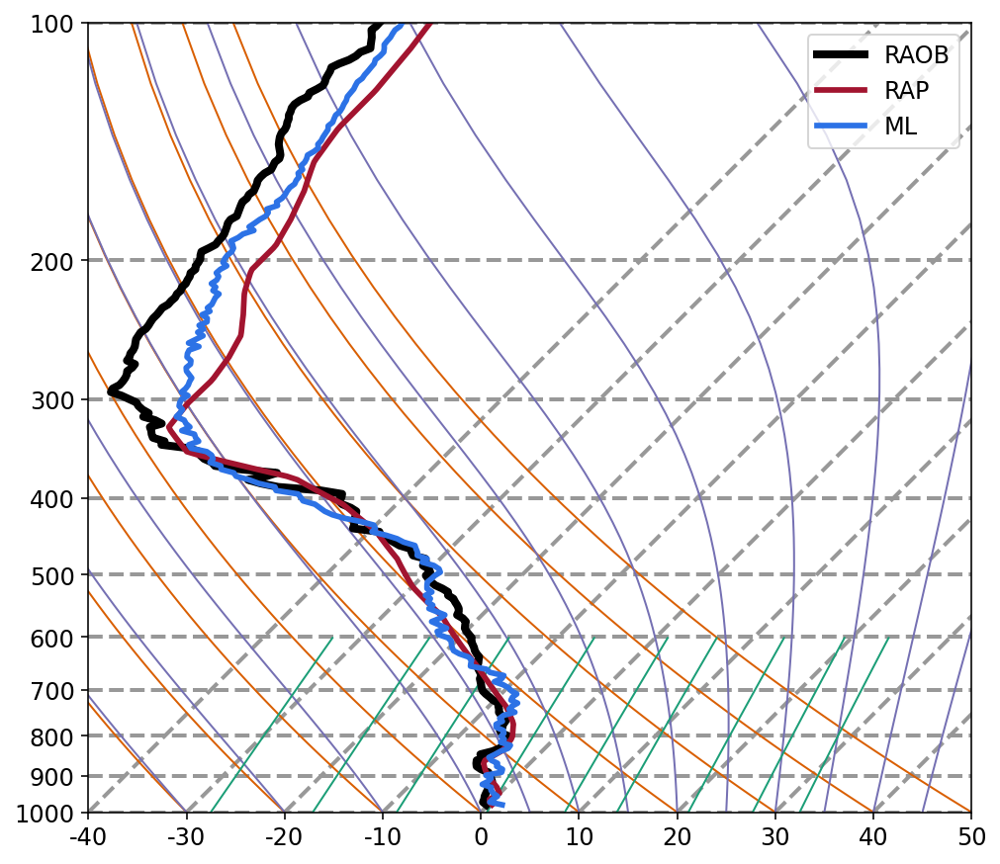

In [31]:
i = 1
sounding = dict()
sounding[radiosonde_utils.PRESSURE_COLUMN_KEY] = Xtest[i,:,dl.PRESSURE]
sounding[radiosonde_utils.TEMPERATURE_COLUMN_KEY] = Te[i]
sounding[radiosonde_utils.NWP_TEMPERATURE_COLUMN_KEY] = Xtest[i,:,dl.DEWPOINT]
sounding[radiosonde_utils.PREDICTED_TEMPERATURE_COLUMN_KEY] = nnet.use(Xe[i:i+1,:])[0]

radiosonde_plotting.plot_nwp_ml_sounding(sounding);

## Conv1D NN

### Temperature

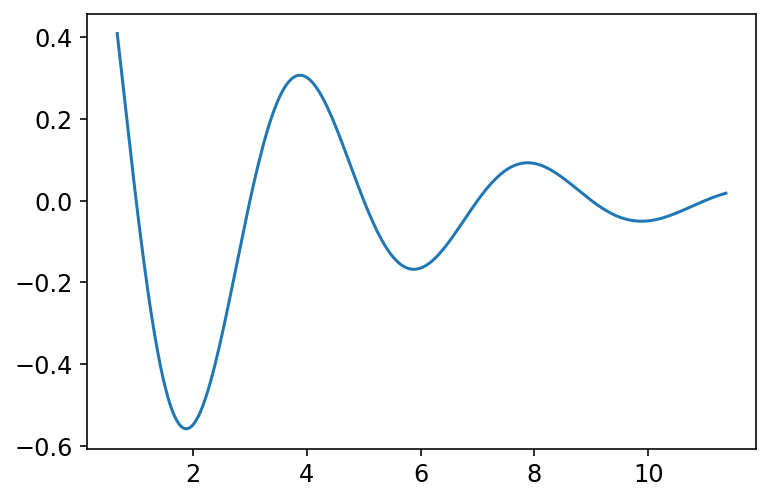

In [204]:
x = np.linspace(np.random.uniform(-4, 4), np.random.uniform(5, 15), 256)
deflection = np.random.randint(1, 5)
damping_coefficent = 0.3
w = 0.5*np.pi
el = deflection * np.exp(-x*damping_coefficent) * np.cos(w * x)
plt.plot(x, el)

In [182]:
def perturb(X, T, shuffle=True):
    temp = copy.copy(X)
    for i in range(len(temp)):
        x = np.linspace(np.random.uniform(-4, 4), np.random.uniform(9, 15), X.shape[1])
        deflection = np.random.randint(1, 5)
        damping_coefficent = 0.3
        w = 0.5*np.pi
        temp[i,:,dl.TEMPERATURE] += deflection * np.exp(-x*damping_coefficent) * np.cos(w * x)

    X = np.concatenate([X, temp])
    T = np.concatenate([T, T])
    
    if shuffle:
        rowIndices = np.arange(len(X))
        np.random.shuffle(rowIndices)
        X = X[rowIndices]
        T = T[rowIndices]
    
    return X, T

In [6]:
Xtrain, Ttrain, Xtest, Ttest = ml.partition(rap, raob, (0.8,0.2), shuffle=True)

# for i in range(2):
#     Xtrain, Ttrain = perturb(Xtrain, Ttrain)

# diff = Xtrain[:,:,dl.TEMPERATURE] - Ttrain[:,:,dl.TEMPERATURE]
# inds = np.unique(np.where(abs(diff) > 12)[0])
# Xtrain = np.delete(Xtrain, inds, 0)
# Ttrain = np.delete(Ttrain, inds, 0)

# diff = Xtest[:,:,dl.TEMPERATURE] - Ttest[:,:,dl.TEMPERATURE]
# inds = np.unique(np.where(abs(diff) > 12)[0])
# Xtest = np.delete(Xtest, inds, 0)
# Ttest = np.delete(Ttest, inds, 0)

input_dims = [dl.PRESSURE, dl.TEMPERATURE]

Xtrain = Xtrain[:, :, input_dims]
Ttrain = Ttrain[:, :, dl.TEMPERATURE] # - Xtrain[:,:,dl.TEMPERATURE]

Xtest = Xtest[:, :, input_dims]
Ttest = Ttest[:, :, dl.TEMPERATURE] # - Xtest[:,:,dl.TEMPERATURE]
Xtrain.shape, Ttrain.shape, Xtest.shape, Ttest.shape

((65021, 256, 2), (65021, 256), (16255, 256, 2), (16255, 256))

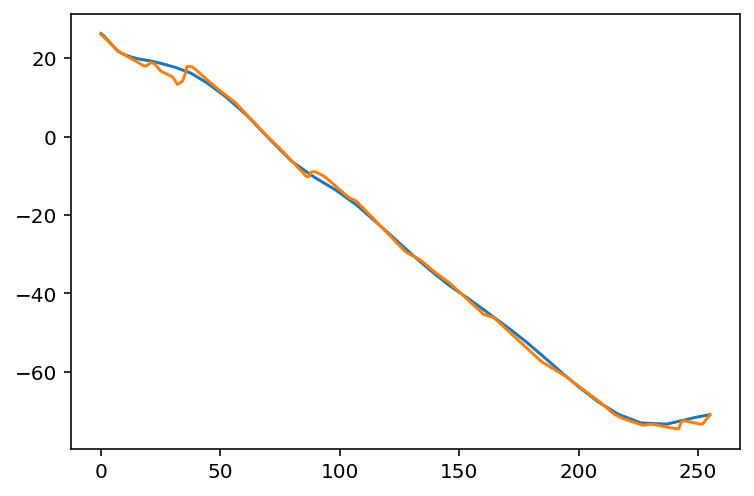

In [7]:
i = 1
plt.plot(Xtest[i, :, 1])
plt.plot(Ttest[i])

In [27]:
activations = ['tanh']
layers = [[128, 64, 32], [32, 64, 128]] + [[nu] * nl for nu in [8, 16, 32, 64, 128] for nl in range(1, 4)]
product = list(itertools.product(activations, layers))

nnet, train_history, val_history = param_search(nn.ConvolutionalNeuralNetwork, product,
                                                Xtrain, Ttrain, Xtest, Ttest,
                                                epochs=30, batch_size=64, method='adam', lr=0.001,
                                                kernels_size_and_stride=[[8, 1]])
plot_param_search(product, train_history, val_history, rotation=45)

FloatProgress(value=0.0, max=17.0)

ValueError: Negative dimension size caused by subtracting 2 from 1 for '{{node max_pooling1d_1/MaxPool}} = MaxPool[T=DT_FLOAT, data_format="NHWC", ksize=[1, 2, 1, 1], padding="VALID", strides=[1, 2, 1, 1]](max_pooling1d_1/ExpandDims)' with input shapes: [?,1,1,64].

In [349]:
Xtrain.shape[1:], Ttrain.shape[1]

((256, 2), 256)

In [45]:
nnet = nn.ConvolutionalNeuralNetwork(Xtrain.shape[1:], [32, 64, 128, 256, 512], 
                                     [(8,1),(8,1),(8,1),(4,1),(4,1)], 
                                     Ttrain.shape[1], activation='relu', dropout=True)
nnet.train(Xtrain, Ttrain, 500, 64, method='adam',
           verbose=True, learning_rate=0.0001, validation=(Xtest, Ttest))

epoch: 0, rmse 8.14657, val_rmse 7.95543
epoch: 100, rmse 1.30415, val_rmse 3.62339
epoch: 200, rmse 1.23049, val_rmse 2.76918
epoch: 300, rmse 1.18313, val_rmse 2.27896
epoch: 400, rmse 1.14945, val_rmse 2.09531
epoch: 499, rmse 1.11881, val_rmse 1.88962
finished!


ConvolutionalNeuralNetwork((256, 2), [32, 64, 128, 256, 512], [(8, 1), (8, 1), (8, 1), (4, 1), (4, 1)], 256)
  Final objective value is 0.02720 in 1242.9944 seconds.

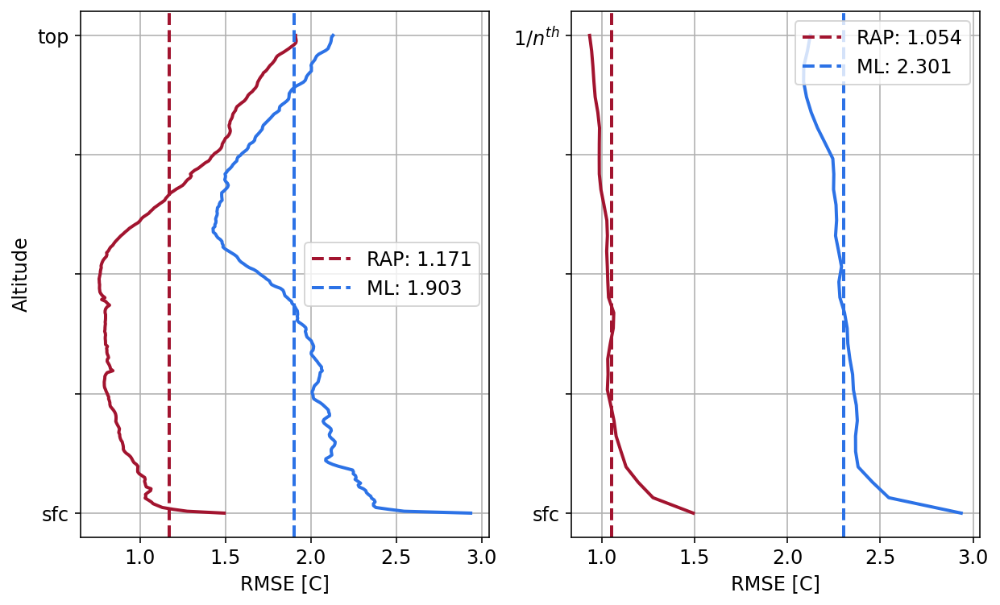

In [49]:
results.plot_altitude_rmse_verticle(nnet, Xtest, Ttest, Xtest[:,:,-1])

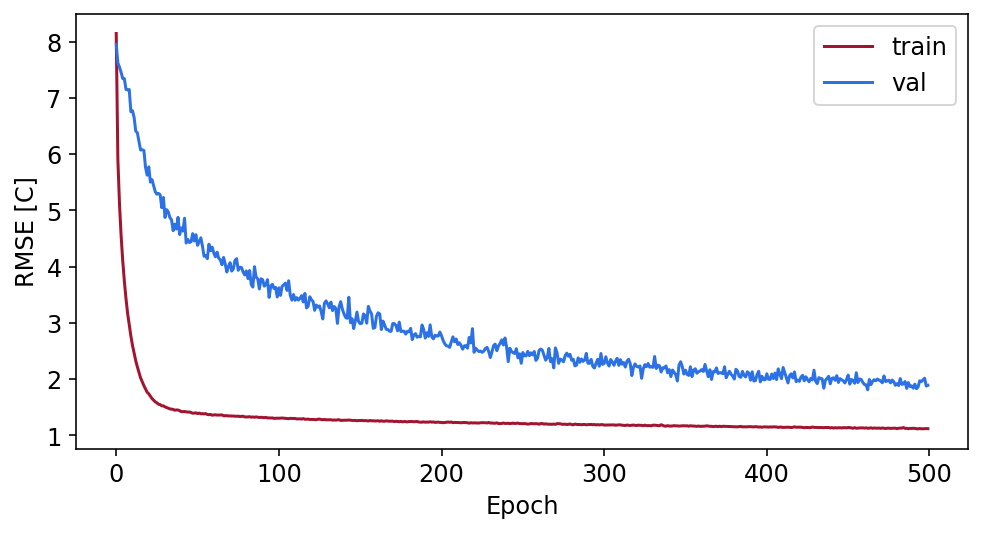

In [47]:
results.plot_loss(nnet)

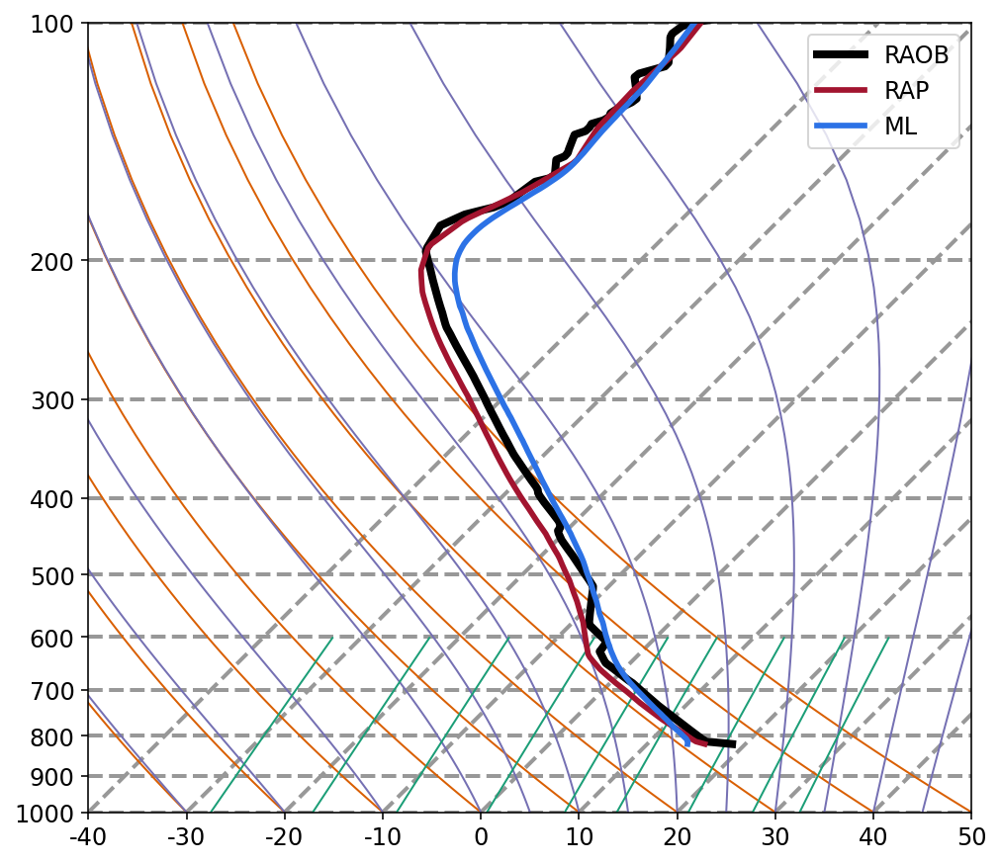

In [42]:
i = 4
sounding = dict()
sounding[radiosonde_utils.PRESSURE_COLUMN_KEY] = Xtest[i,:,dl.PRESSURE]
sounding[radiosonde_utils.TEMPERATURE_COLUMN_KEY] = Ttest[i] # + Xtest[i,:,dl.TEMPERATURE]
sounding[radiosonde_utils.NWP_TEMPERATURE_COLUMN_KEY] = Xtest[i,:,dl.TEMPERATURE] 
sounding[radiosonde_utils.PREDICTED_TEMPERATURE_COLUMN_KEY] = nnet.use(Xtest[i:i+1,:])[0] # + Xtest[i,:,dl.TEMPERATURE]

radiosonde_plotting.plot_nwp_ml_sounding(sounding);

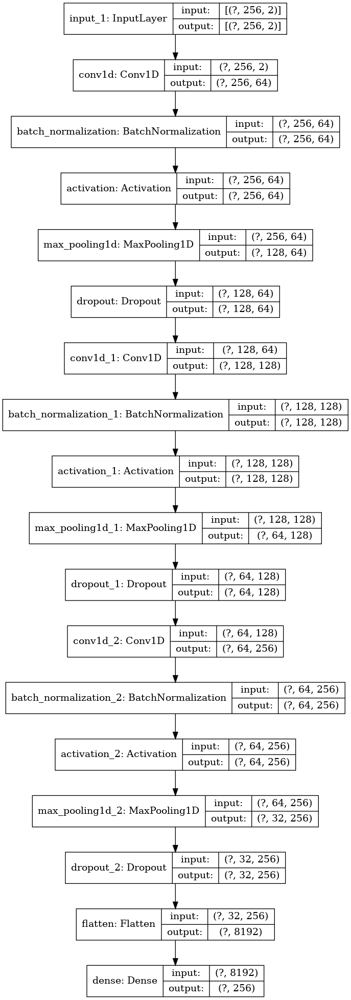

In [37]:
tf.keras.utils.plot_model(nnet.model, '/home/stock/research/media/rap_only_network.png',
                          show_shapes=True, rankdir='TB', dpi=96) # LR/TB positioning

### Moisture

In [39]:
Xtrain, Ttrain, Xtest, Ttest = ml.partition(rap, raob, (0.8,0.2), shuffle=False)

input_dims = [dl.PRESSURE, dl.DEWPOINT]

Xtrain = Xtrain[:, :, input_dims]
Ttrain = Ttrain[:, :, dl.DEWPOINT]

Xtest = Xtest[:, :, input_dims]
Ttest = Ttest[:, :, dl.DEWPOINT]
Xtrain.shape, Ttrain.shape, Xtest.shape, Ttest.shape

((1026, 256, 2), (1026, 256), (257, 256, 2), (257, 256))

FloatProgress(value=0.0, max=17.0)

{'epochs': 25, 'batch_size': 32, 'method': 'adam', 'lr': 0.001, 'activation': 'tanh', 'layers': [16]}


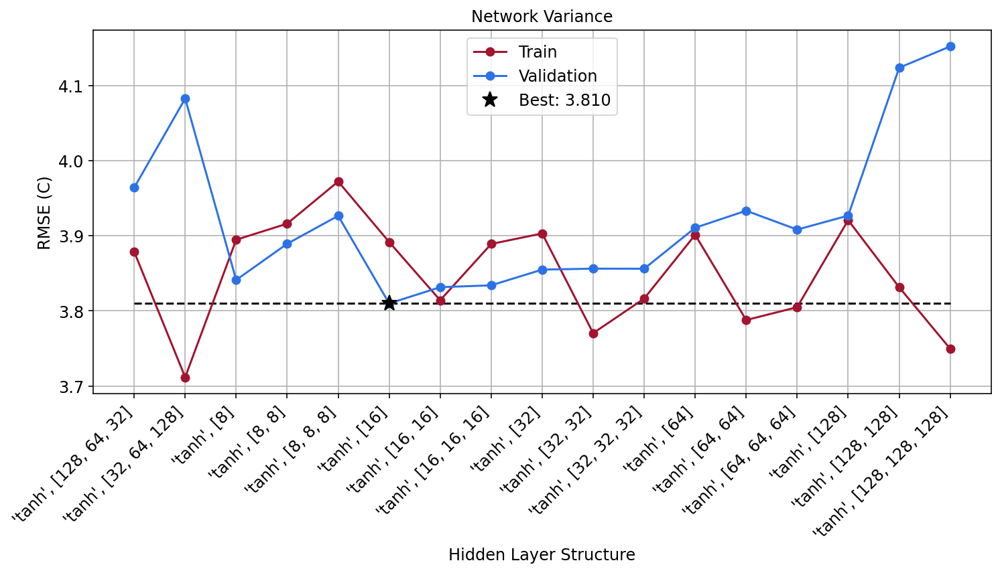

In [40]:
activations = ['tanh']
layers = [[128, 64, 32], [32, 64, 128]] + [[nu] * nl for nu in [8, 16, 32, 64, 128] for nl in range(1, 4)]
product = list(itertools.product(activations, layers))

nnet, train_history, val_history = param_search(nn.ConvolutionalNeuralNetwork, product,
                                                Xtrain, Ttrain, Xtest, Ttest,
                                                epochs=25, batch_size=32, method='adam', lr=0.001,
                                                kernels_size_and_stride=[[10, 1]])
plot_param_search(product, train_history, val_history, rotation=45)

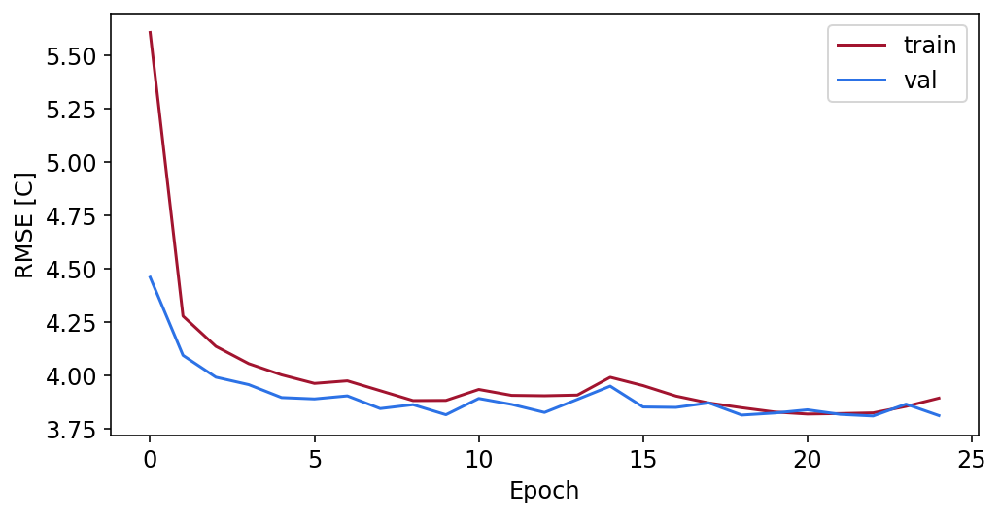

In [41]:
results.plot_loss(nnet)

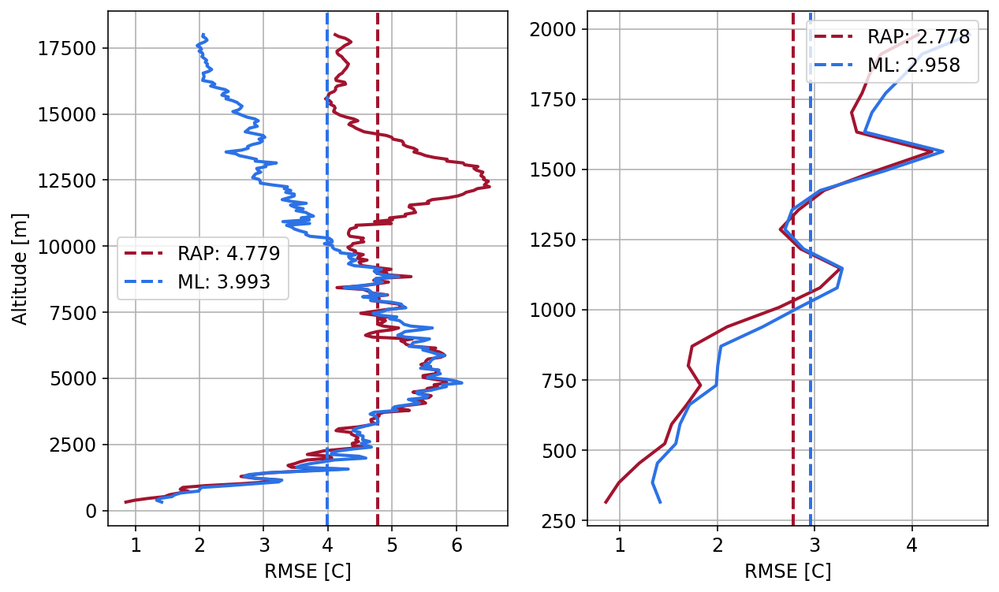

In [42]:
results.plot_altitude_rmse_verticle(nnet, Xtest, Ttest, Xtest[:,:,-1], alt=raob[0, :, -1])

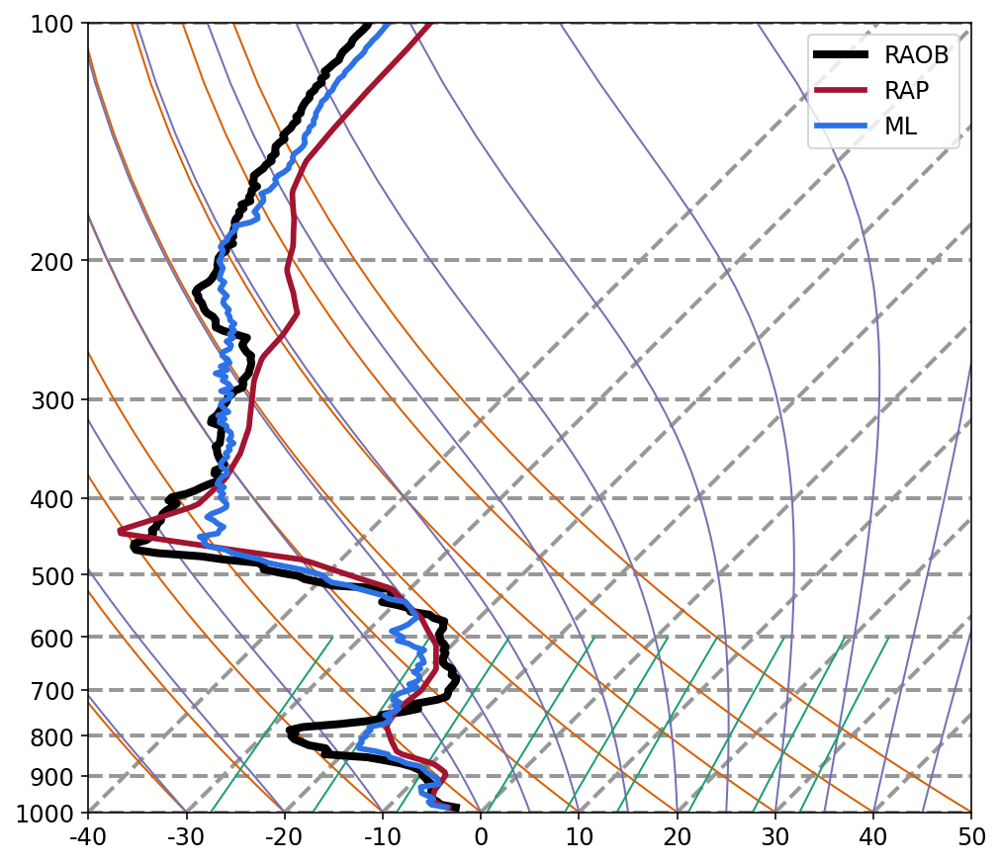

In [43]:
i = 0
sounding = dict()
sounding[radiosonde_utils.PRESSURE_COLUMN_KEY] = Xtrain[i,:,dl.PRESSURE]
sounding[radiosonde_utils.TEMPERATURE_COLUMN_KEY] = Ttrain[i]
sounding[radiosonde_utils.NWP_TEMPERATURE_COLUMN_KEY] = Xtrain[i,:,-1]
sounding[radiosonde_utils.PREDICTED_TEMPERATURE_COLUMN_KEY] = nnet.use(Xtrain[i:i+1,:])[0]

radiosonde_plotting.plot_nwp_ml_sounding(sounding);

## CAE NN

### Temperature

In [8]:
Xtrain, Ttrain, Xtest, Ttest = ml.partition(rap, raob, (0.8,0.2), shuffle=True)

input_dims = [dl.PRESSURE, dl.TEMPERATURE]

Xtrain = Xtrain[:, :, input_dims]
Ttrain = Ttrain[:, :, dl.TEMPERATURE]

Xtest = Xtest[:, :, input_dims]
Ttest = Ttest[:, :, dl.TEMPERATURE]
Xtrain.shape, Ttrain.shape, Xtest.shape, Ttest.shape

((65021, 256, 2), (65021, 256), (16255, 256, 2), (16255, 256))

FloatProgress(value=0.0, max=12.0)

{'epochs': 35, 'batch_size': 32, 'method': 'adam', 'lr': 0.001, 'activation': 'relu', 'layers': [16]}


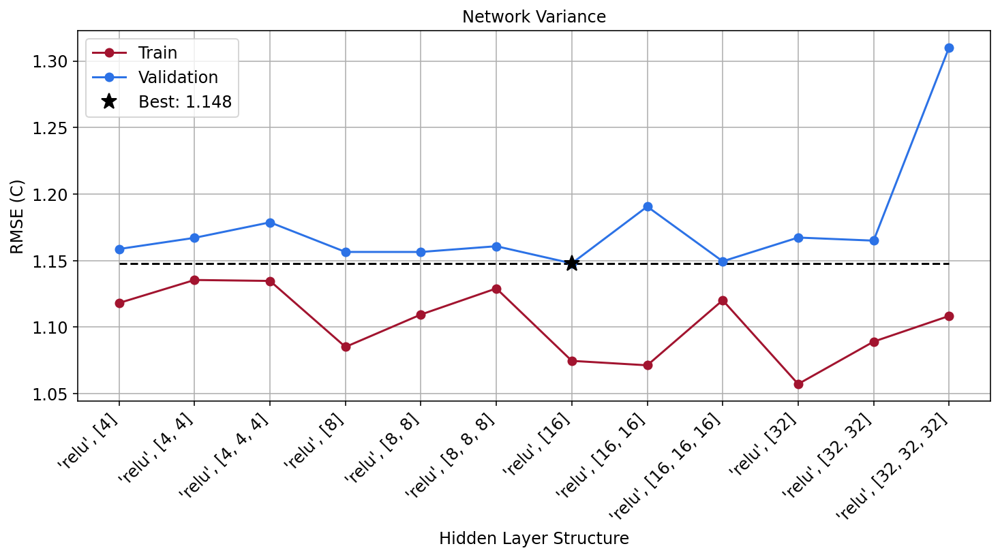

In [13]:
activations = ['relu']
layers = [[nu] * nl for nu in [4, 8, 16, 32] for nl in range(1, 4)]
product = list(itertools.product(activations, layers))

nnet, train_history, val_history = param_search(nn.ConvolutionalAutoEncoder, product,
                                                Xtrain, Ttrain, Xtest, Ttest,
                                                epochs=35, batch_size=32, method='adam',
                                                lr=0.001, kernels_size_and_stride=[[10, 1]])
plot_param_search(product, train_history, val_history, rotation=45)

In [9]:
nnet = nn.ConvolutionalAutoEncoder(Xtrain.shape[1:], [64, 128, 256], 
                                   [(5,1),(3,1),(3,1)], 
                                   Ttrain.shape[1], activation='relu', dropout=True)
nnet.train(Xtrain, Ttrain, 100, 256, method='adam',
           verbose=True, learning_rate=0.001, validation=(Xtest, Ttest))

epoch: 0, rmse 2.77675, val_rmse 3.55368
epoch: 20, rmse 1.48666, val_rmse 2.54286
epoch: 40, rmse 1.45742, val_rmse 2.15849
epoch: 60, rmse 1.44778, val_rmse 2.16315
epoch: 80, rmse 1.44680, val_rmse 2.24599
epoch: 99, rmse 1.43138, val_rmse 2.11803
finished!


ConvolutionalAutoEncoder((256, 2), [64, 128, 256], [(5, 1), (3, 1), (3, 1)], 256)
  Final objective value is 0.04455 in 417.4771 seconds.

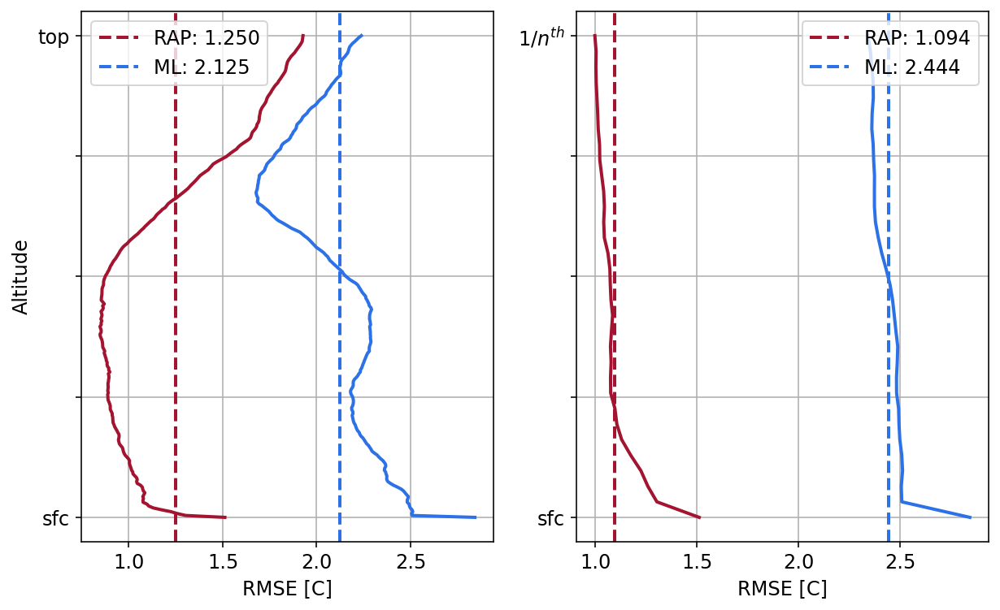

In [10]:
results.plot_altitude_rmse_verticle(nnet, Xtest, Ttest, Xtest[:,:,dl.TEMPERATURE], alt=raob[0, :, -1])
                   #file_name=f"/home/stock/research/media/raob_cae_rmse.png")

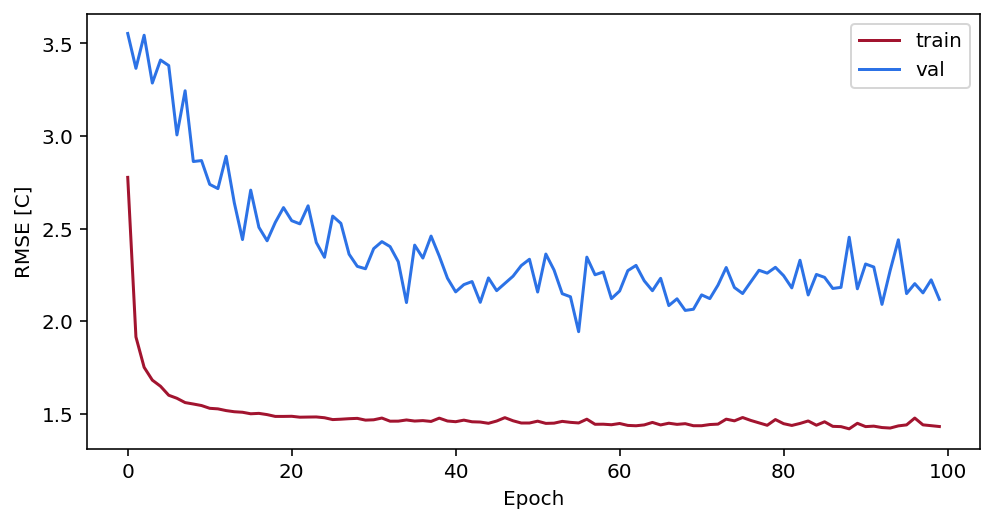

In [11]:
results.plot_loss(nnet)

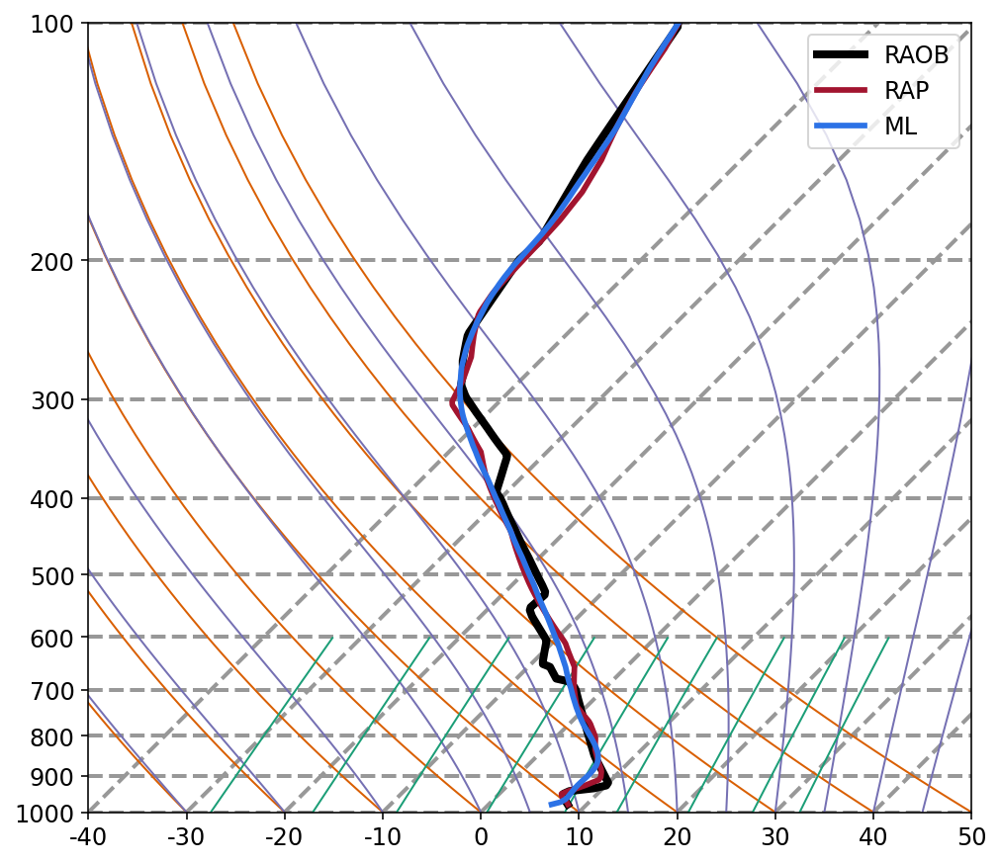

In [12]:
i = 4
sounding = dict()
sounding[radiosonde_utils.PRESSURE_COLUMN_KEY] = Xtest[i,:,dl.PRESSURE]
sounding[radiosonde_utils.TEMPERATURE_COLUMN_KEY] = Ttest[i]
sounding[radiosonde_utils.NWP_TEMPERATURE_COLUMN_KEY] = Xtest[i,:,dl.TEMPERATURE]
sounding[radiosonde_utils.PREDICTED_TEMPERATURE_COLUMN_KEY] = nnet.use(Xtest[i:i+1,:])[0]

radiosonde_plotting.plot_nwp_ml_sounding(sounding);

### Moisture

In [49]:
Xtrain, Ttrain, Xtest, Ttest = ml.partition(rap, raob, (0.8,0.2), shuffle=False)

input_dims = [dl.PRESSURE, dl.DEWPOINT]

Xtrain = Xtrain[:, :, input_dims]
Ttrain = Ttrain[:, :, dl.DEWPOINT]

Xtest = Xtest[:, :, input_dims]
Ttest = Ttest[:, :, dl.DEWPOINT]
Xtrain.shape, Ttrain.shape, Xtest.shape, Ttest.shape

((1026, 256, 2), (1026, 256), (257, 256, 2), (257, 256))

FloatProgress(value=0.0, max=12.0)

{'epochs': 35, 'batch_size': 32, 'method': 'adam', 'lr': 0.001, 'activation': 'tanh', 'layers': [4, 4, 4]}


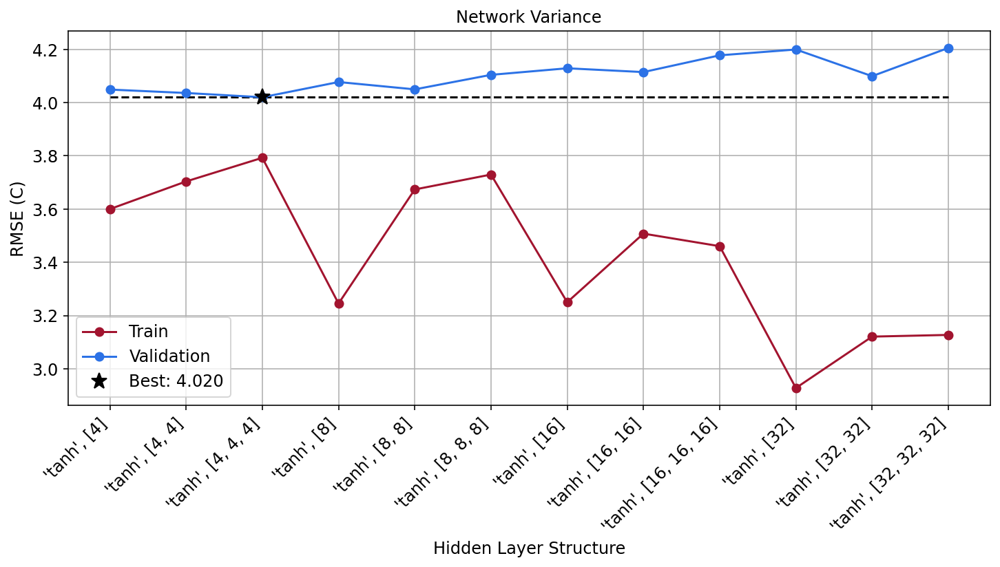

In [50]:
activations = ['tanh']
layers = [[nu] * nl for nu in [4, 8, 16, 32] for nl in range(1, 4)]
product = list(itertools.product(activations, layers))

nnet, train_history, val_history = param_search(nn.ConvolutionalAutoEncoder, product,
                                                Xtrain, Ttrain, Xtest, Ttest,
                                                epochs=35, batch_size=32, method='adam',
                                                lr=0.001, kernels_size_and_stride=[[10, 1]])
plot_param_search(product, train_history, val_history, rotation=45)

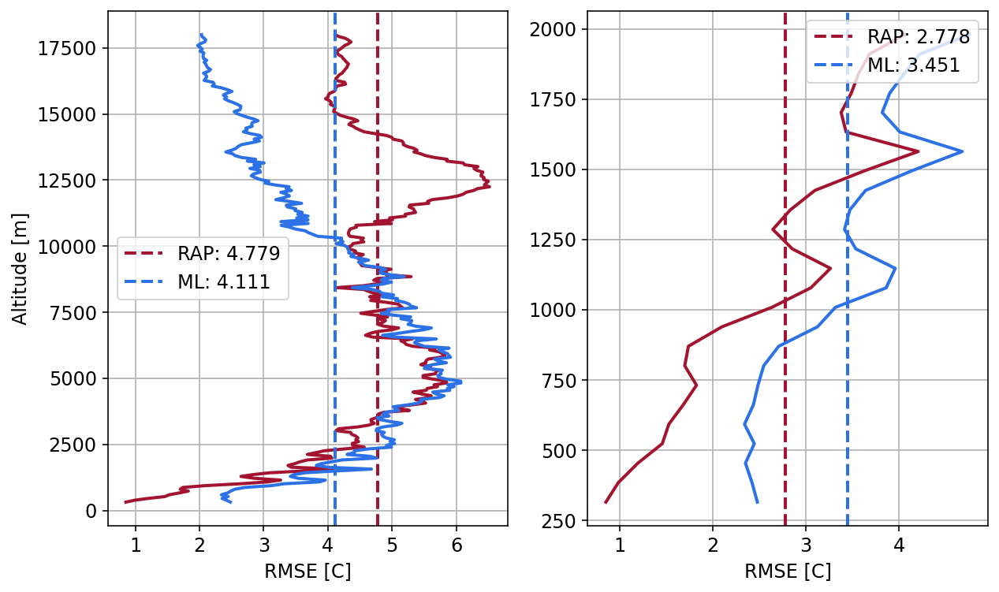

In [51]:
results.plot_altitude_rmse_verticle(nnet, Xtest, Ttest, Xtest[:,:,-1], alt=raob[0, :, -1])
                   #file_name=f"/home/stock/research/media/raob_cae_rmse.png")

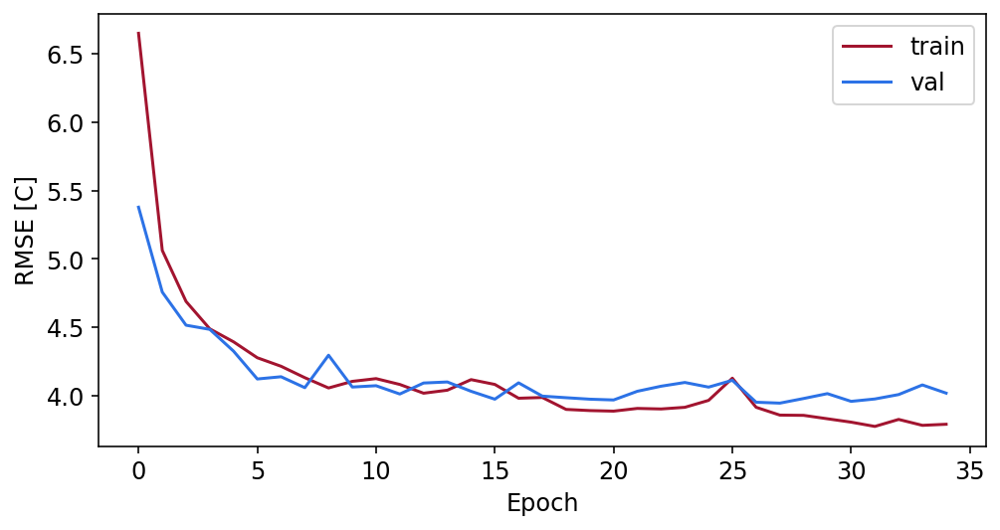

In [52]:
results.plot_loss(nnet)

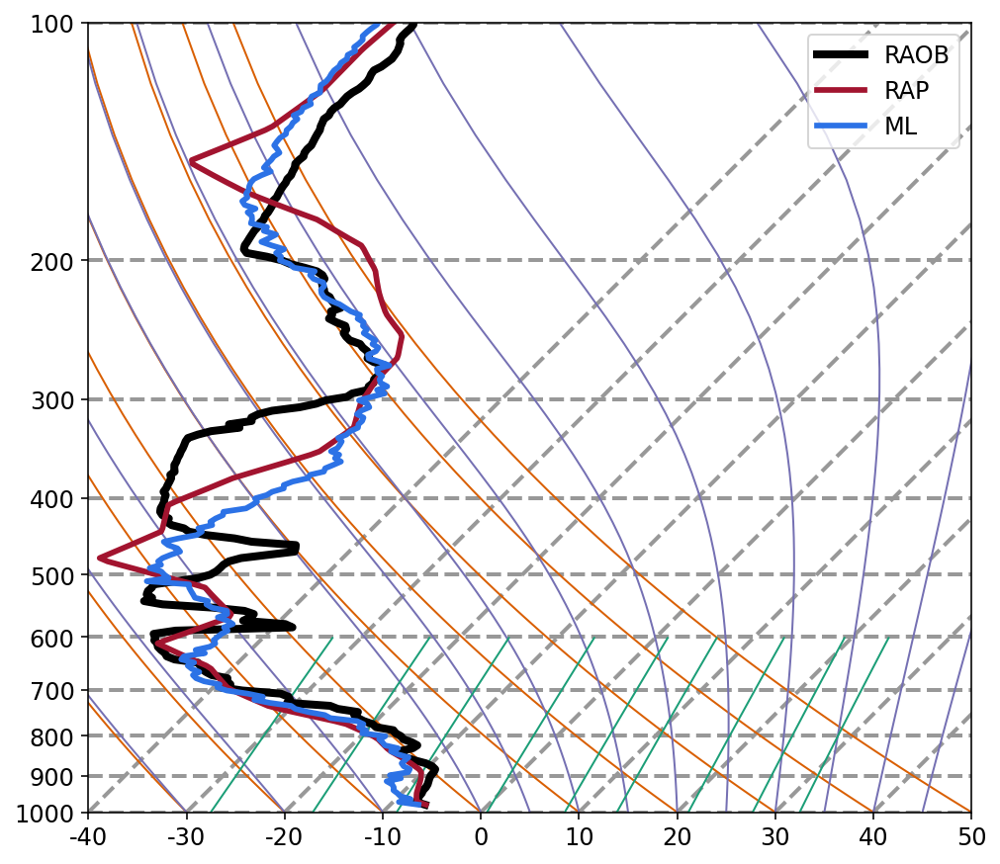

In [53]:
i = 4
sounding = dict()
sounding[radiosonde_utils.PRESSURE_COLUMN_KEY] = Xtest[i,:,dl.PRESSURE]
sounding[radiosonde_utils.TEMPERATURE_COLUMN_KEY] = Ttest[i]
sounding[radiosonde_utils.NWP_TEMPERATURE_COLUMN_KEY] = Xtest[i,:,-1]
sounding[radiosonde_utils.PREDICTED_TEMPERATURE_COLUMN_KEY] = nnet.use(Xtest[i:i+1,:])[0]

radiosonde_plotting.plot_nwp_ml_sounding(sounding);

## UNet Model

### Temperature

In [51]:
# monthly = np.flatnonzero(np.core.defchararray.find(sonde_files, '2019-06')!=-1)

Xtrain, Ttrain, Xtest, Ttest = ml.partition(rap, raob, (0.85,0.15), shuffle=True)

input_dims = [dl.TEMPERATURE]

Xtrain = Xtrain[:, :, input_dims]
Ttrain = Ttrain[:, :, dl.TEMPERATURE]

Xtest = Xtest[:, :, input_dims]
Ttest = Ttest[:, :, dl.TEMPERATURE]
Xtrain.shape, Ttrain.shape, Xtest.shape, Ttest.shape

((29912, 256, 1), (29912, 256), (5279, 256, 1), (5279, 256))

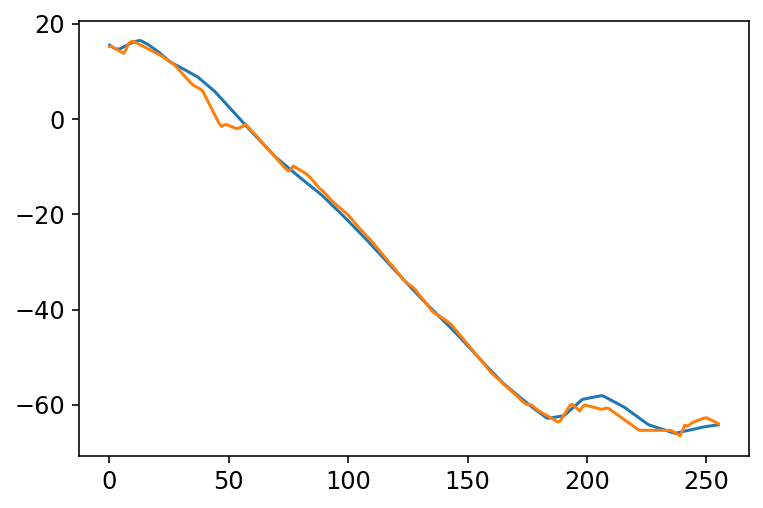

In [52]:
i = 16
plt.plot(Xtrain[i])
plt.plot(Ttrain[i])

In [53]:
nnet = nn.SkipNeuralNetwork(Xtrain.shape[1:], [32, 64, 128, 256, 512], 
                            [(8, 1),(8, 1),(4, 1),(4, 1),(4,1)],
                            Ttrain.shape[1])
# nnet.model.summary()
nnet.train(Xtrain, Ttrain, 100, 128, method='adam', verbose=True,
           learning_rate=0.0001, validation=[Xtest, Ttest])

epoch: 0, rmse 3.72318, val_rmse 1.15867
epoch: 20, rmse 1.12160, val_rmse 1.12725
epoch: 40, rmse 1.09372, val_rmse 1.11037
epoch: 60, rmse 1.07870, val_rmse 1.10540
epoch: 80, rmse 1.05517, val_rmse 1.10482
epoch: 99, rmse 1.02700, val_rmse 1.10767
finished!


SkipNeuralNetwork((256, 1), [32, 64, 128, 256, 512], [(8, 1), (8, 1), (4, 1), (4, 1), (4, 1)], 256)
  Final objective value is 0.02632 in 455.3414 seconds.

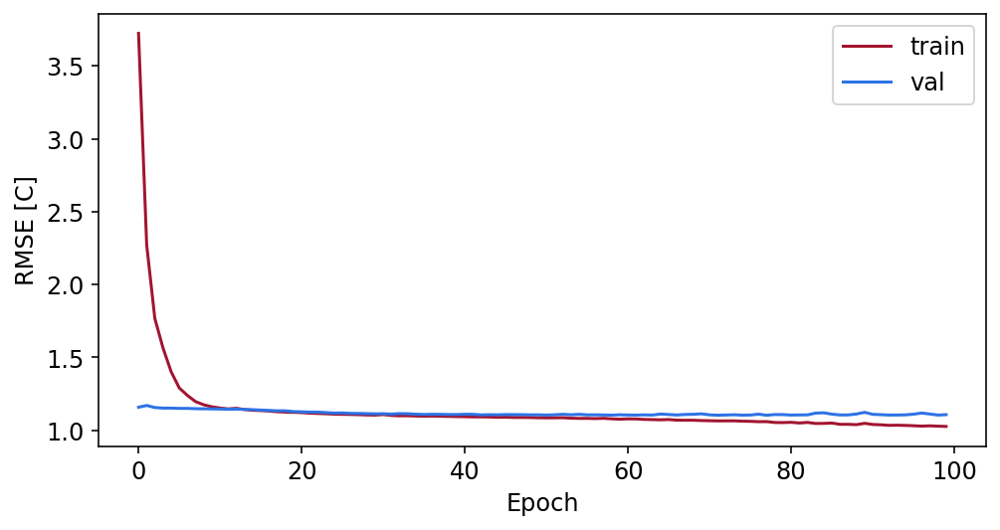

In [54]:
results.plot_loss(nnet)

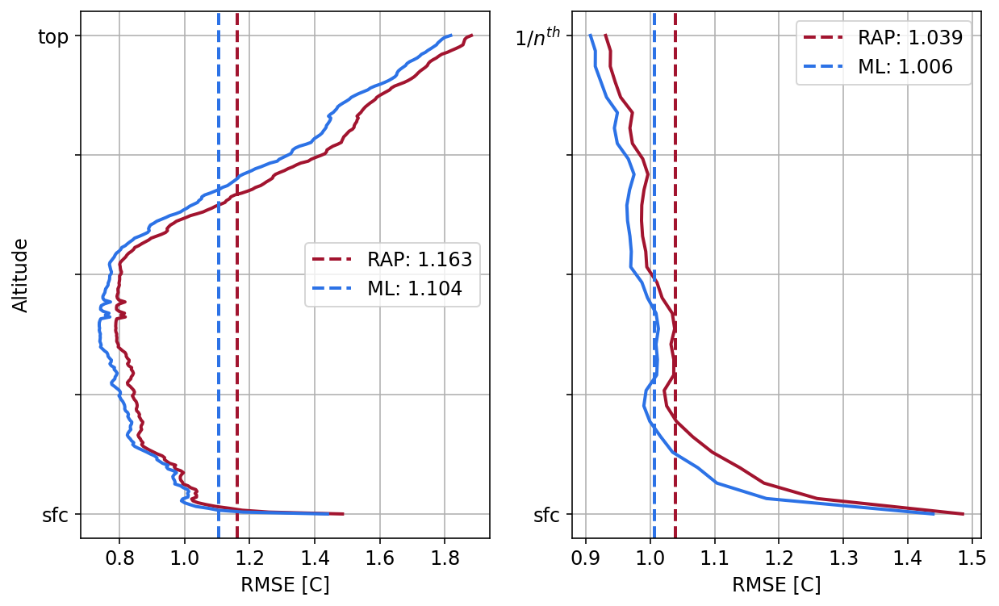

In [55]:
results.plot_altitude_rmse_verticle(nnet, Xtest, Ttest, Xtest[:,:,-1])
                   #file_name=f"/home/stock/research/media/raob_cae_rmse.png")

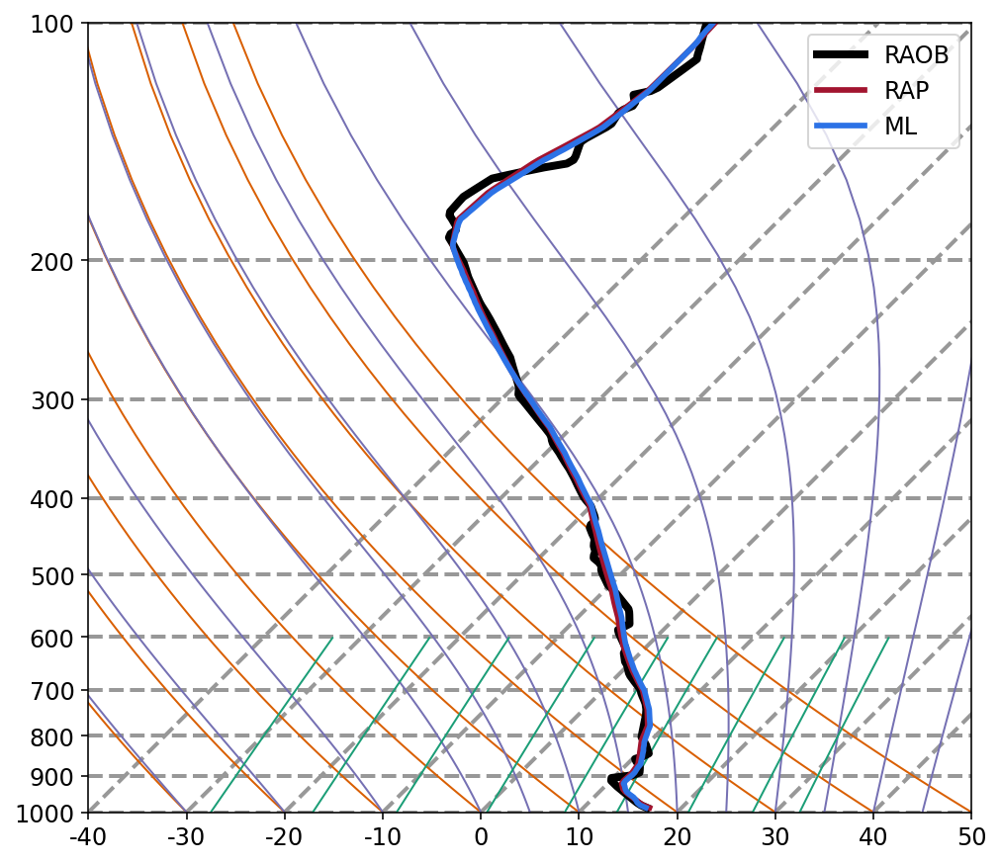

In [220]:
i = 15
sounding = dict()
sounding[radiosonde_utils.PRESSURE_COLUMN_KEY] = Xtest[i,:,dl.PRESSURE]
sounding[radiosonde_utils.TEMPERATURE_COLUMN_KEY] = Ttest[i]
sounding[radiosonde_utils.NWP_TEMPERATURE_COLUMN_KEY] = Xtest[i,:,dl.TEMPERATURE]
sounding[radiosonde_utils.PREDICTED_TEMPERATURE_COLUMN_KEY] = nnet.use(Xtest[i:i+1,:])[0]

radiosonde_plotting.plot_nwp_ml_sounding(sounding);

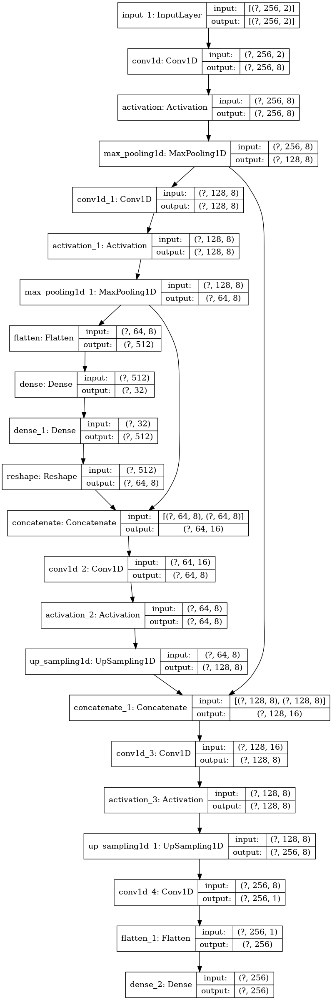

In [36]:
tf.keras.utils.plot_model(nnet.model, '/home/stock/research/media/unet.png',
                          show_shapes=True, rankdir='TB', dpi=96) # LR/TB positioning

### Moisture

In [56]:
OG_Xtrain, OG_Ttrain, OG_Xtest, OG_Ttest = ml.partition(rap, raob, (0.8,0.2), shuffle=True)

input_dims = [dl.DEWPOINT]

Xtrain = OG_Xtrain[:, :, input_dims]
Ttrain = OG_Ttrain[:, :, dl.DEWPOINT]

Xtest = OG_Xtest[:, :, input_dims]
Ttest = OG_Ttest[:, :, dl.DEWPOINT]
Xtrain.shape, Ttrain.shape, Xtest.shape, Ttest.shape

((28153, 256, 1), (28153, 256), (7038, 256, 1), (7038, 256))

In [57]:
nnet = nn.SkipNeuralNetwork(Xtrain.shape[1:], [32, 64, 128, 256, 512], 
                            [(8, 1),(8, 1),(4, 1),(4, 1),(4,1)],
                            Ttrain.shape[1])
# nnet.model.summary()
nnet.train(Xtrain, Ttrain, 100, 128, method='adam', verbose=True,
           learning_rate=0.0001, validation=[Xtest, Ttest])

epoch: 0, rmse 6.89359, val_rmse 5.65882
epoch: 20, rmse 4.79503, val_rmse 4.79489
epoch: 40, rmse 4.63906, val_rmse 4.88107
epoch: 60, rmse 4.37755, val_rmse 4.91505
epoch: 80, rmse 4.16547, val_rmse 4.98184
epoch: 99, rmse 4.01009, val_rmse 5.08036
finished!


SkipNeuralNetwork((256, 1), [32, 64, 128, 256, 512], [(8, 1), (8, 1), (4, 1), (4, 1), (4, 1)], 256)
  Final objective value is 0.14393 in 412.5614 seconds.

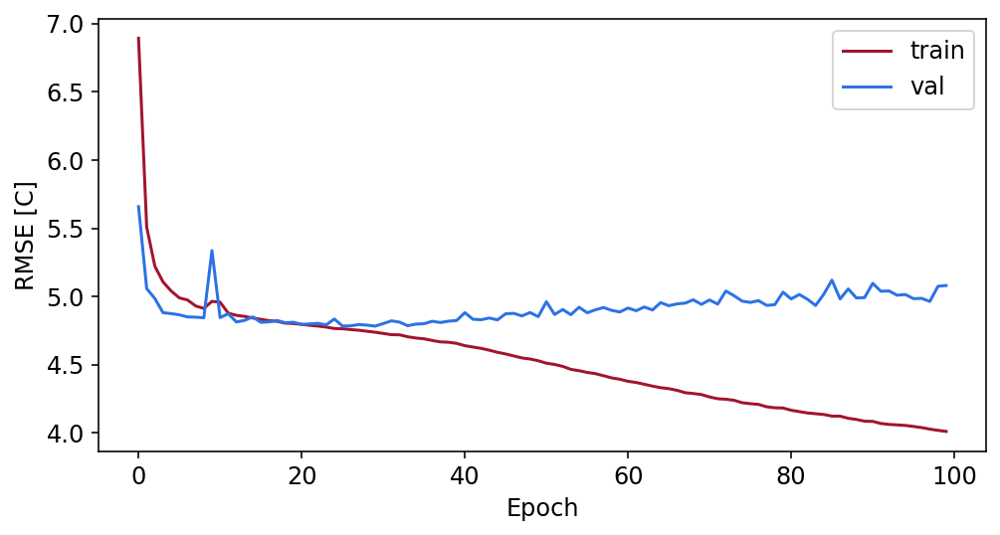

In [58]:
results.plot_loss(nnet)

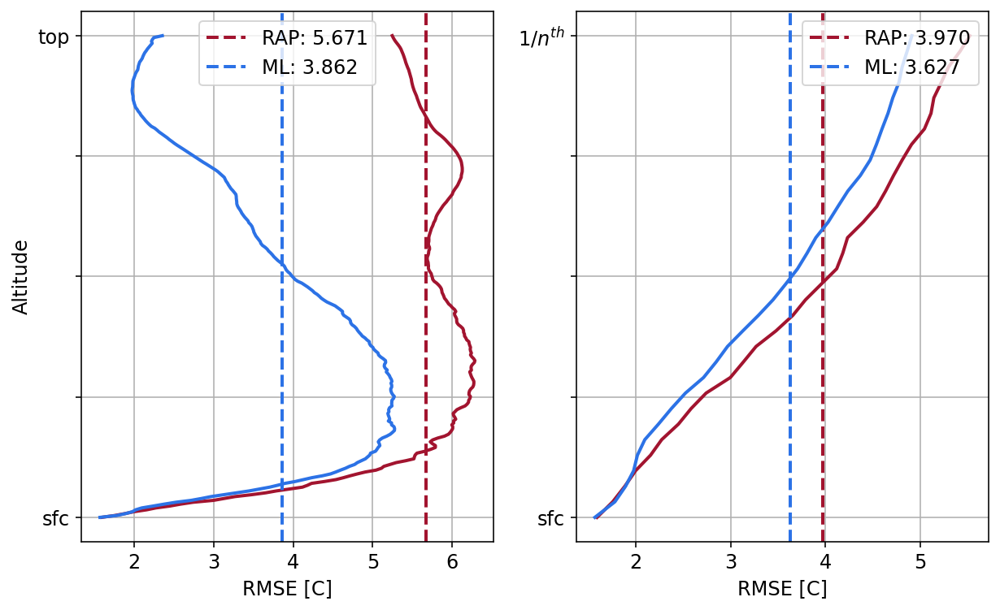

In [61]:
results.plot_altitude_rmse_verticle(nnet, Xtrain, Ttrain, Xtrain[:,:,-1])
                   #file_name=f"/home/stock/research/media/raob_cae_rmse.png")

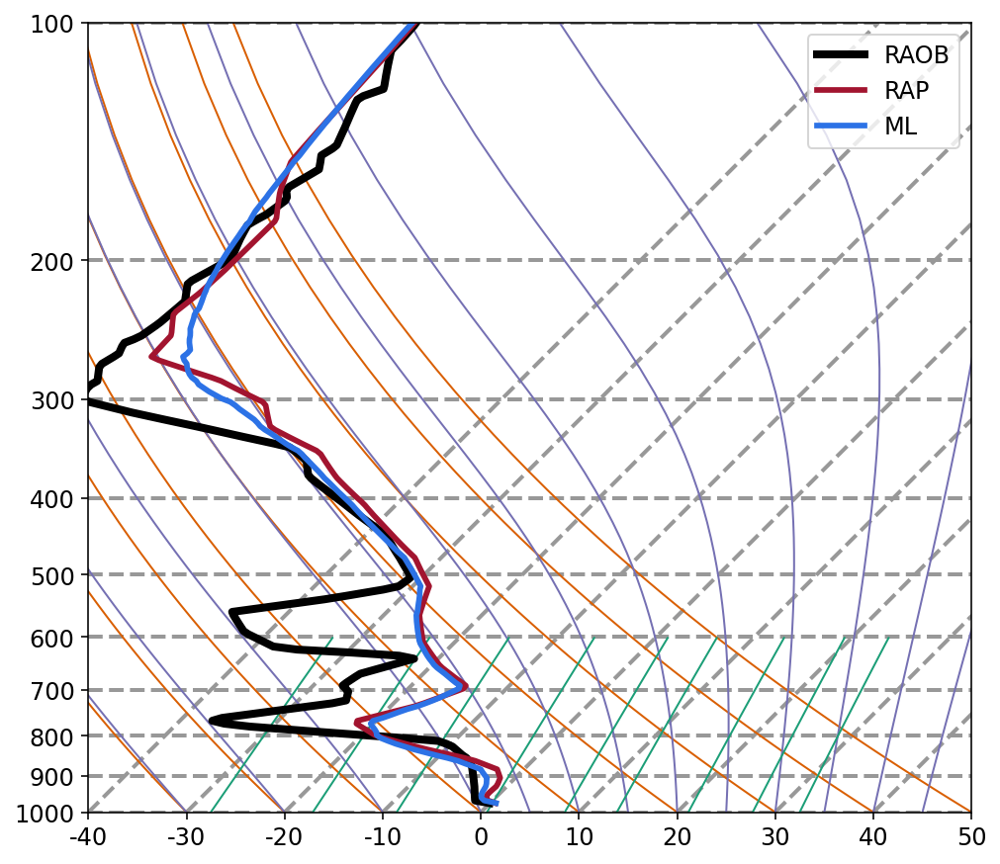

In [66]:
i = 4
sounding = dict()
sounding[radiosonde_utils.PRESSURE_COLUMN_KEY] = OG_Xtest[i,:,dl.PRESSURE]
sounding[radiosonde_utils.TEMPERATURE_COLUMN_KEY] = Ttest[i]
sounding[radiosonde_utils.NWP_TEMPERATURE_COLUMN_KEY] = Xtest[i,:,-1]
sounding[radiosonde_utils.PREDICTED_TEMPERATURE_COLUMN_KEY] = nnet.use(Xtest[i:i+1,:])[0]

radiosonde_plotting.plot_nwp_ml_sounding(sounding);

## Transfer Learning RAOB

Best performance is noticed when retraining over the entire model, or freezing the weights before the latent vector.

In [37]:
def insert_intermediate_layer(model, layer_regex, layer_factory):
    x = model.layers[0].output
    for layer in model.layers[1:]:
        x = layer(x)
        if re.match(layer_regex, layer.name):
            new_layer = layer_factory()
            new_layer._name = f'{layer.name}_{new_layer.name}'
            x = new_layer(x)
            print(f'Added {new_layer.name} after {layer.name}')
    return tf.keras.Model(model.layers[0].input, x)

In [39]:
Xtrain, Ttrain, Xtest, Ttest = ml.partition(rap, raob, (0.8,0.2), shuffle=False)

input_dims = [dl.PRESSURE, dl.TEMPERATURE]

Xtrain = Xtrain[:, :, input_dims]
Ttrain = Ttrain[:, :, dl.TEMPERATURE]

Xtest = Xtest[:, :, input_dims]
Ttest = Ttest[:, :, dl.TEMPERATURE]
Xtrain.shape, Ttrain.shape, Xtest.shape, Ttest.shape

((1026, 256, 2), (1026, 256), (257, 256, 2), (257, 256))

In [59]:
## 0.970 with raob_cae freeze before `dense` with 20, 32, 0.0001 'adam'

nnet = nn.loadnn('/mnt/data1/stock/mlsoundings/models/raob_cae')
# nnet = nn.loadnn('/mnt/data1/stock/mlsoundings/models/raob_moisture_cae')
# nnet = nn.loadnn('/mnt/data1/stock/mlsoundings/models/raob_noisy_cae')
# nnet = nn.loadnn('/mnt/data1/stock/mlsoundings/models/raob_temperature_cnn')
# nnet = nn.loadnn('/mnt/data1/stock/mlsoundings/models/raob_noisy_temperature_cae')

def dropout_layer_factory():
    return tf.keras.layers.Dropout(rate=0.2, name='dropout')
def batchnorm_layer_factory():
    return tf.keras.layers.BatchNormalization(name='batch_norm')

# (?<![\w\d])dense(?![\w\d])
# nnet.model = insert_intermediate_layer(nnet.model, '(?<![\w\d])conv1d(?![\w\d])', batchnorm_layer_factory)
# nnet.model = insert_intermediate_layer(nnet.model, 'max_pool', dropout_layer_factory)

# for layer in nnet.model.layers[:-2]:
#     if layer == nnet.model.get_layer('dense'):
#         break
#     layer.trainable = False
    
nnet.model.trainable = False
    
# Remove last Dense layer and add new one.
x = nnet.model.layers[-2].output
x = tf.keras.layers.Dropout(0.2)(x)
x = tf.keras.layers.Dense(256)(x)
nnet.model = tf.keras.Model(nnet.model.layers[0].input, x)
    
nnet.train(Xtrain, Ttrain, 20, 32, validation=[Xtest, Ttest], method='adam',
                 learning_rate=0.001, verbose=True)

epoch: 0, rmse 4.95107, val_rmse 3.85870
epoch: 5, rmse 2.17407, val_rmse 1.64850
epoch: 10, rmse 1.85505, val_rmse 1.29578
epoch: 15, rmse 1.72353, val_rmse 1.18399
epoch: 19, rmse 1.66528, val_rmse 1.14644
finished!


ConvolutionalAutoEncoder((256, 2), [8, 8], [(10, 1), (10, 1)], 256)
  Final objective value is 0.08971 in 4.2490 seconds.

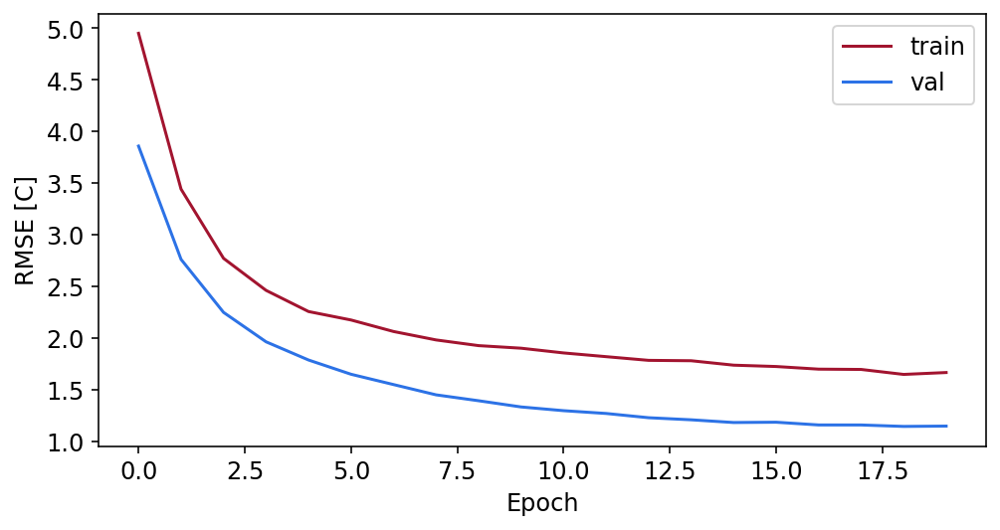

In [61]:
results.plot_loss(nnet)

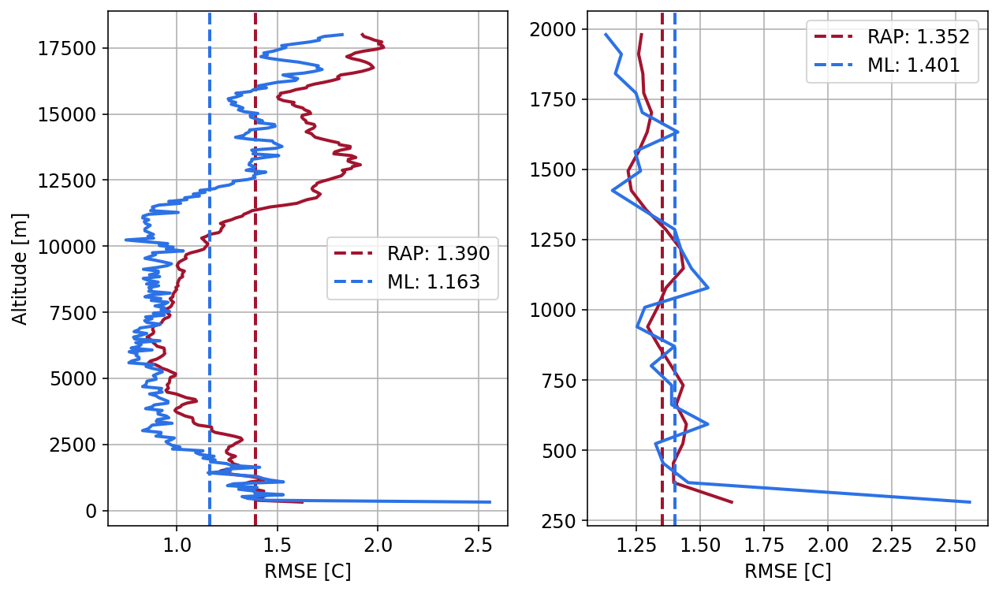

In [62]:
results.plot_altitude_rmse_verticle(nnet, Xtest, Ttest, Xtest[:,:,-1], alt=raob[0, :, -1])
                            # file_name=f"/home/stock/research/media/transferlearning-temp-profile.png")

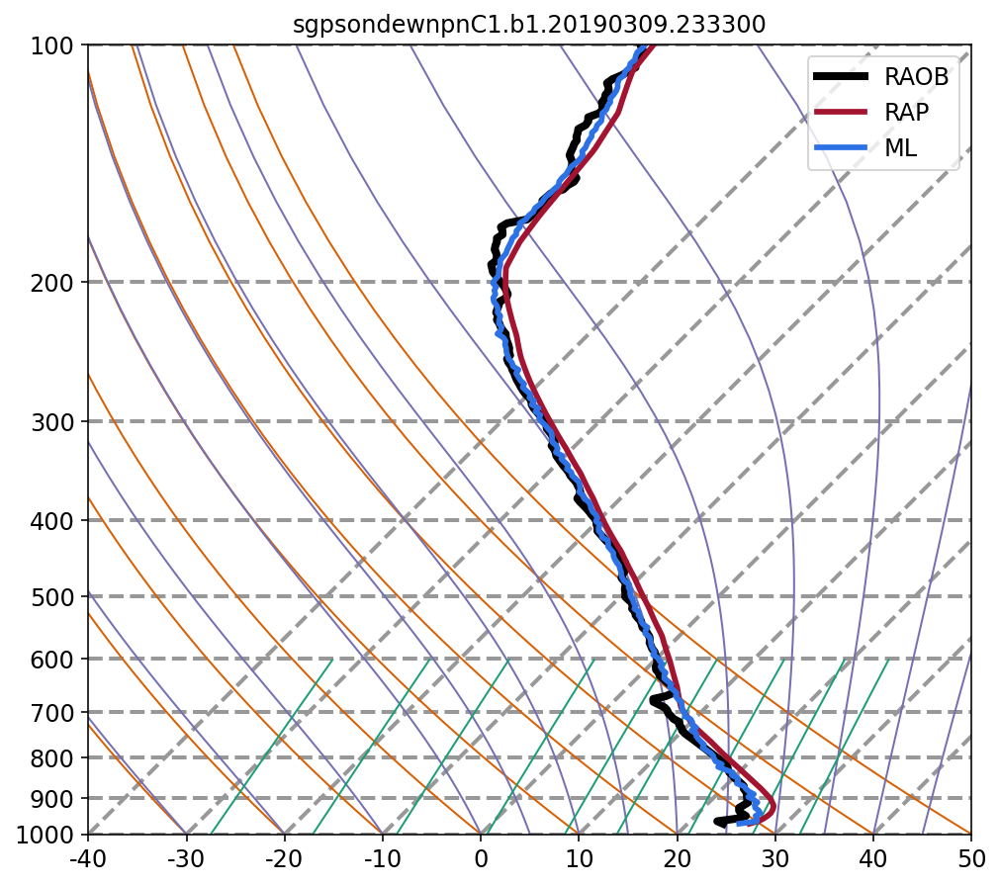

In [60]:
i = 69 # 69
sounding = dict()
sounding[radiosonde_utils.PRESSURE_COLUMN_KEY] = Xtest[i,:,dl.PRESSURE]
sounding[radiosonde_utils.TEMPERATURE_COLUMN_KEY] = Ttest[i]
sounding[radiosonde_utils.NWP_TEMPERATURE_COLUMN_KEY] = Xtest[i,:,dl.TEMPERATURE]
sounding[radiosonde_utils.PREDICTED_TEMPERATURE_COLUMN_KEY] = nnet.use(Xtest[i:i+1])[0]

# sounding[radiosonde_utils.DEWPOINT_COLUMN_KEY] = Ttest[i,:,1]
# sounding[radiosonde_utils.NWP_DEWPOINT_COLUMN_KEY] = Xtest[i,:,dl.DEWPOINT]
# sounding[radiosonde_utils.PREDICTED_DEWPOINT_COLUMN_KEY] = moist_nnet.use(Xtest[i:i+1,:,[dl.PRESSURE,dl.DEWPOINT]])[0]

title = sonde_files[i].split('/')[-1][:-4]
radiosonde_plotting.plot_nwp_ml_sounding(sounding, title_string=title);
                                         # file_name=f"/home/stock/research/media/{title}-rapvraob.png");